In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch 
from scipy.stats import pearsonr

from transformers import AutoTokenizer
from transformers import GPT2LMHeadModel

from sklearn.preprocessing import StandardScaler

# Gender Bias subspace through SVD?

There are several kinds of bias (stereotypes): racial, age-related, religion-related, gender-related.

Here we will try to analyse gender-related bias. In interest of time, we picked a bias that would be 'binary' (male and female). 
We ackowledge that gender is in fact not binary, but in interest of time and of our dataset, we analyse gender-related bias as binary.


## Data

We choose a set of words from https://github.com/chadaeun/weat_replication/blob/master/weat/Careers_Female_Male

This set of words, this dataset, has been used already in the the paper "Semantics derived automatically from language corpora contain human-like biases" by Caliskan, Bryson and Narayanan (2017) - given this, we find it interesting to explore this set of words further.


We create a matrix with these words (meaning, their tokenized word vectors) as rows, and the columns will be the latent spaces (768) from out GPT2 model.


Additionally, we scale each latent space (each column) to ensure that they all span equally.


## WEAT 6: science and arts target words along with male and female attributes 

Male names: John, Paul, Mike, Kevin, Steve, Greg, Jeff, Bill

Female names: Amy, Joan, Lisa, Sarah, Diana, Kate, Ann, Donna

Career words : executive, management, professional, corporation, salary, office, business, career
Family words : home, parents, children, family, cousins, marriage, wedding, relatives

## WEAT 7: science and arts target words along with male and female attributes 


Math words : math, algebra, geometry, calculus, equations, computation, numbers, addition
Arts Words : poetry, art, dance, literature, novel, symphony, drama, sculpture

Male attributes: male, man, boy, brother, he, him, his, son

Female attributes: female, woman, girl, sister, she, her, hers, daughter

## WEAT 8: science and arts target words along with male and female attributes

Science words : science, technology, physics, chemistry, Einstein, NASA, experiment, astronomy
Arts words : poetry, art, Shakespeare, dance, literature, novel, symphony, drama

Male attributes: brother, father, uncle, grandfather, son, he, his, him

Female attributes: sister, mother, aunt, grandmother, daughter, she, hers, her

## WEFAT 1: occupations - in this notebook

Careers : technician, accountant, supervisor, engineer, worker, educator, clerk, counselor, inspector, mechanic, manager, therapist, administrator, salesperson, receptionist, librarian, advisor, pharmacist, janitor, psychologist, physician, carpenter, nurse, investigator, bartender, specialist, electrician, officer, pathologist, teacher, lawyer, planner, practitioner, plumber, instructor, surgeon, veterinarian, paramedic, examiner, chemist, machinist, appraiser, nutritionist, architect, hairdresser, baker, programmer, paralegal, hygienist, scientist

Female attributes: female, woman, girl, sister, she, her, hers, daughter

Male attributes: male, man, boy, brother, he, him, his, son

In [2]:
ws = ' technician, accountant, supervisor, engineer, worker, educator, clerk, counselor, inspector, mechanic, manager, therapist, administrator, salesperson, receptionist, librarian, advisor, pharmacist, janitor, psychologist, physician, carpenter, nurse, investigator, bartender, specialist, electrician, officer, pathologist, teacher, lawyer, planner, practitioner, plumber, instructor, surgeon, veterinarian, paramedic, examiner, chemist, machinist, appraiser, nutritionist, architect, hairdresser, baker, programmer, paralegal, hygienist, scientist, female, woman, girl, sister, she, her, hers, daughter, male, man, boy, brother, he, him, his, son'
ws = ws.strip().split(', ')
ws = [' ' + w for w in ws]
len(ws), ws[:5]

(66, [' technician', ' accountant', ' supervisor', ' engineer', ' worker'])

In [3]:
# ws[:50]
ws[50:58], ws[59:]

([' female',
  ' woman',
  ' girl',
  ' sister',
  ' she',
  ' her',
  ' hers',
  ' daughter'],
 [' man', ' boy', ' brother', ' he', ' him', ' his', ' son'])

In [4]:
model = GPT2LMHeadModel.from_pretrained('model_unique_rev_best/')
tok = AutoTokenizer.from_pretrained('gpt2')
tok.add_special_tokens({'pad_token': '<|endoftext|>'})

0

In [5]:
def get_word_vec(text):
    model_inp = tok(text, return_tensors='pt')
    outputs = model(**model_inp, output_hidden_states=True)
    hidden_states = outputs.hidden_states
    final_rep = hidden_states[-1]  # (1, N tokens, 768)
    final_rep = final_rep.mean(axis=1) # this makes it work also for special cases 
    final_rep = final_rep.squeeze()
    return final_rep

In [6]:
get_word_vec(ws[0]).shape

torch.Size([768])

In [7]:
dat = torch.zeros((len(ws), 768))
dat    

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

In [8]:
for ix, w in enumerate(ws):
    vec = get_word_vec(w)
    dat[ix, :] = vec
    
dat = dat.detach().numpy()
dat

array([[ 0.24856812, -1.0440538 , -0.38530695, ...,  0.03990982,
        -0.10753424,  0.00730459],
       [ 0.24470082, -1.0627973 , -0.32391465, ...,  0.02515118,
        -0.11964516,  0.01268686],
       [ 0.28352463, -0.9936409 , -0.33112872, ...,  0.02041074,
        -0.08235381,  0.01357216],
       ...,
       [ 0.16942759, -1.0756208 , -0.3418127 , ...,  0.03772319,
        -0.12411934, -0.00527881],
       [ 0.17104769, -1.0647882 , -0.38084367, ...,  0.02220581,
        -0.11339206, -0.03194879],
       [ 0.2556951 , -1.0188776 , -0.28324574, ...,  0.05187357,
        -0.12833916, -0.04818548]], dtype=float32)

In [9]:
dat.shape

(66, 768)

In [10]:
scaler = StandardScaler() #this scales the columns
scaled_dat = scaler.fit_transform(dat)
scaled_dat

array([[ 0.15342568, -0.54872143,  0.28647512, ..., -0.05758736,
        -0.19219445,  0.10803889],
       [ 0.11968773, -0.6133966 ,  0.5322287 , ..., -0.28732455,
        -0.34637487,  0.14668944],
       [ 0.4583831 , -0.37476996,  0.50335073, ..., -0.36111563,
         0.12837   ,  0.1530469 ],
       ...,
       [-0.53698903, -0.6576444 ,  0.4605827 , ..., -0.09162512,
        -0.40333423,  0.0176763 ],
       [-0.52285546, -0.6202663 ,  0.30434167, ..., -0.33317298,
        -0.26676846, -0.17384331],
       [ 0.21560086, -0.46185017,  0.6950264 , ...,  0.12864365,
        -0.45705542, -0.29044047]], dtype=float32)

## Bias subspace through SVD

Previous literature has explored the hypothesis of bias being in a linear subspace("Exploring the Linear Subspace Hypothesis in Gender Bias Mitigation", Vargas, Cotterell 2020, "Black is to Criminal as Cucasian is to Police: Detecting and Removing Multiclass Bias in Word Embeddings" Manzini, Lim, Tsvetkov, Black, 2019). In this paper, we try to explore whether in our dataset there gender bias is instrinsic of any specific mode given a singular value decomposition.


First, we try to explore whether there are some careers and words that get clustered around gendered words. To do this, we plot the first 2 principal componenets to explore whether some clusters and 'key' words/careers arise.

### Quick Dimensionality Redux + Plotting

In [11]:
from sklearn.decomposition import PCA

In [12]:
scaled_dat.shape

(66, 768)

In [13]:
pca = PCA(n_components = 4)

red_dat = pca.fit_transform(scaled_dat)
red_dat.shape

(66, 4)

In [14]:
pca.explained_variance_ratio_

array([0.4538047 , 0.08861692, 0.07082921, 0.06177512], dtype=float32)

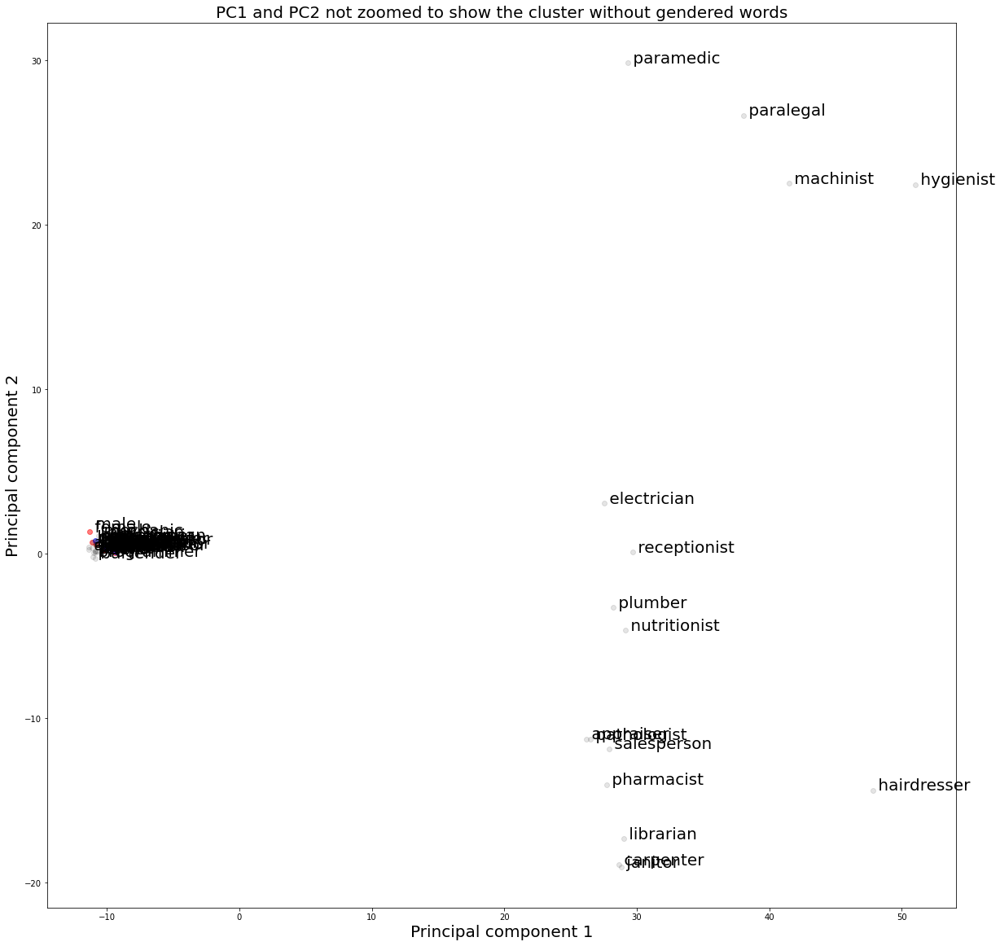

In [15]:
#plt.scatter(red_dat[:50, 0], red_dat[:50, 1], c='k') #first 50 are career words
plt.figure(figsize=(20, 20))

plt.title("PC1 and PC2 not zoomed to show the cluster without gendered words", size = 20)


plt.scatter(red_dat[50:58, 0], red_dat[50:58, 1], c='r', alpha = 0.5) # female words
plt.scatter(red_dat[59:, 0], red_dat[59:, 1], c='b', alpha = 0.5) # male words
plt.scatter(red_dat[:50, 0], red_dat[:50, 1], c='k', alpha = 0.1) #first 50 are career words

for i, name in enumerate(ws):
    plt.annotate(name, (red_dat[i,0], red_dat[i,1]), size = 20)
    
plt.xlabel("Principal component 1", size = 20)
plt.ylabel("Principal component 2", size = 20)
plt.savefig('pc_fig1.png')

plt.show()

# plt.xlim(-14, -5)
# plt.ylim(-1.5, 1.5)

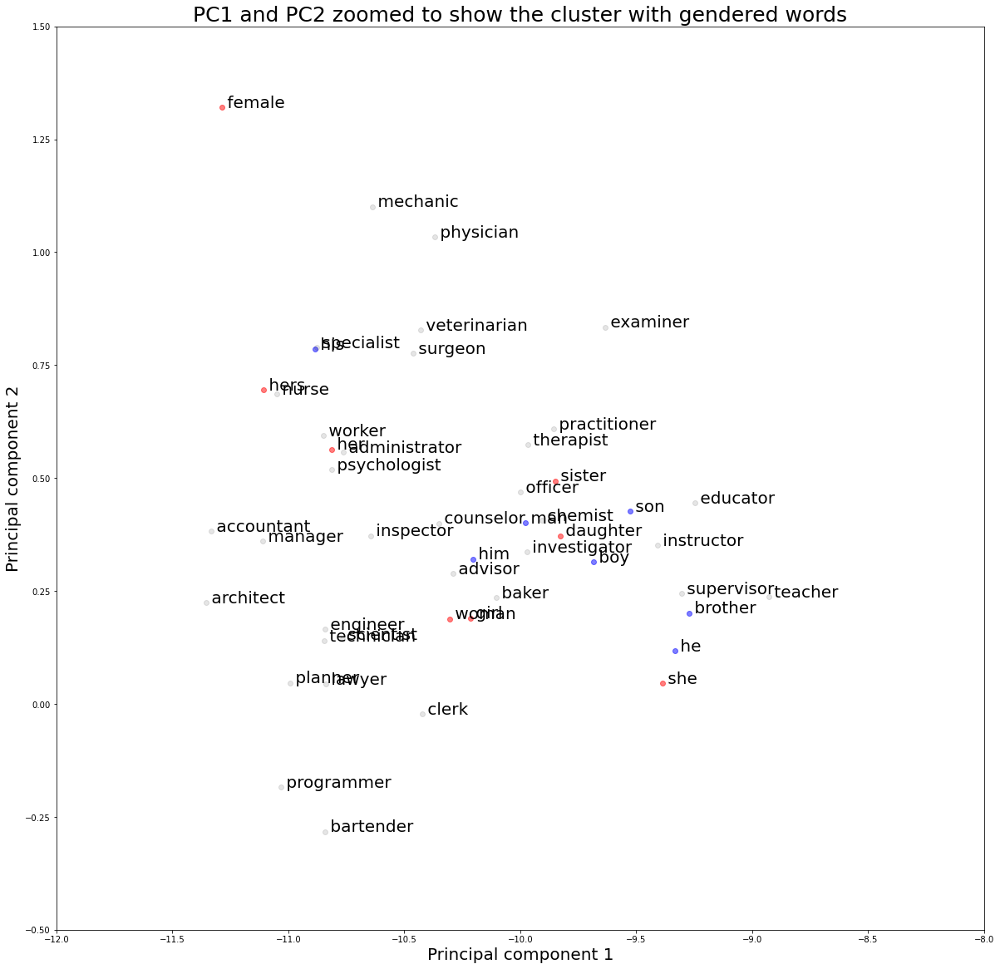

In [16]:
#plt.scatter(red_dat[:50, 0], red_dat[:50, 1], c='k') #first 50 are career words
plt.figure(figsize=(20, 20))
plt.title("PC1 and PC2 zoomed to show the cluster with gendered words", size = 25)
plt.scatter(red_dat[50:58, 0], red_dat[50:58, 1], c='r', alpha = 0.5) # female words
plt.scatter(red_dat[59:, 0], red_dat[59:, 1], c='b', alpha = 0.5) # male words
plt.scatter(red_dat[:50, 0], red_dat[:50, 1], c='k', alpha = 0.1) #first 50 are career words

for i, name in enumerate(ws):
    plt.annotate(name, (red_dat[i,0], red_dat[i,1]), size = 20)

plt.xlim(-12, -8)
plt.ylim(-0.5, 1.5)
plt.xlabel("Principal component 1", size = 20)
plt.ylabel("Principal component 2", size = 20)
plt.savefig('pc_fig2.png')


plt.show()

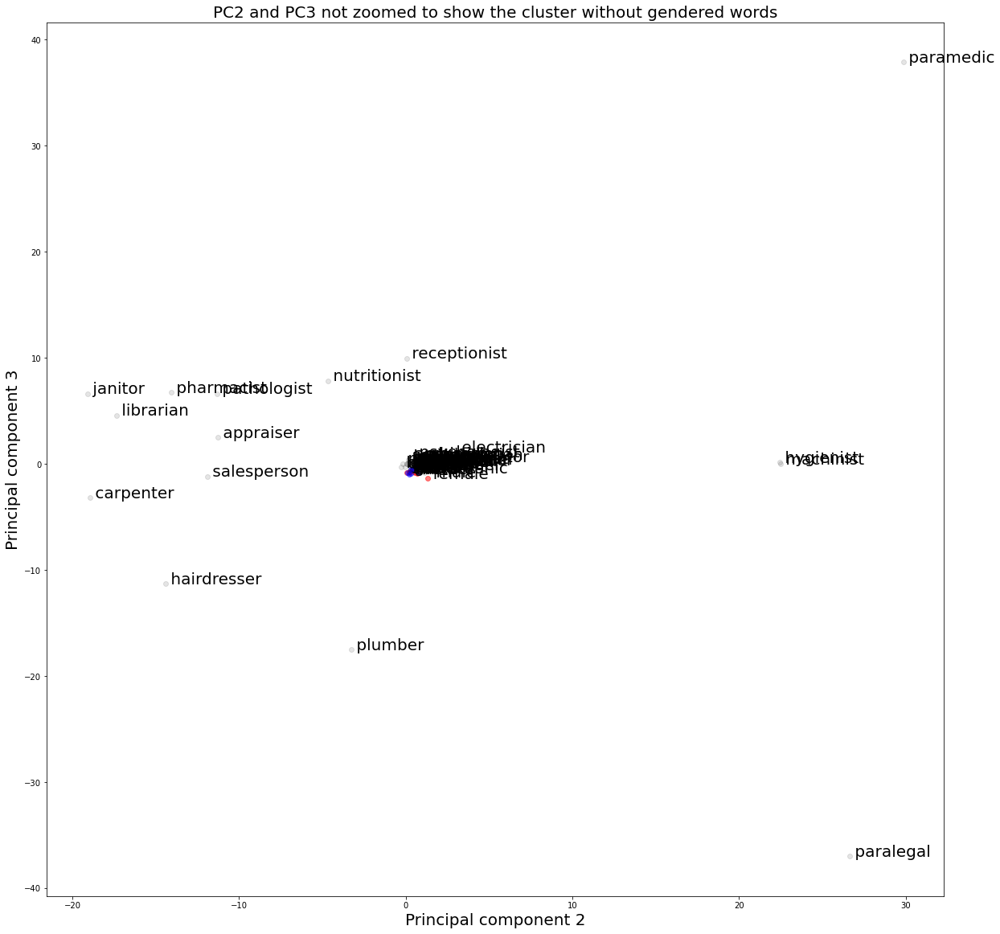

In [17]:
#plt.scatter(red_dat[:50, 0], red_dat[:50, 1], c='k') #first 50 are career words
plt.figure(figsize=(20, 20))

plt.title("PC2 and PC3 not zoomed to show the cluster without gendered words", size = 20)


plt.scatter(red_dat[50:58, 1], red_dat[50:58, 2], c='r', alpha = 0.5) # female words
plt.scatter(red_dat[59:, 1], red_dat[59:, 2], c='b', alpha = 0.5) # male words
plt.scatter(red_dat[:50, 1], red_dat[:50, 2], c='k', alpha = 0.1) #first 50 are career words

for i, name in enumerate(ws):
    plt.annotate(name, (red_dat[i,1], red_dat[i,2]), size = 20)
    
plt.xlabel("Principal component 2", size = 20)
plt.ylabel("Principal component 3", size = 20)
plt.savefig('pc_fig1.png')

plt.show()

# plt.xlim(-14, -5)
# plt.ylim(-1.5, 1.5)

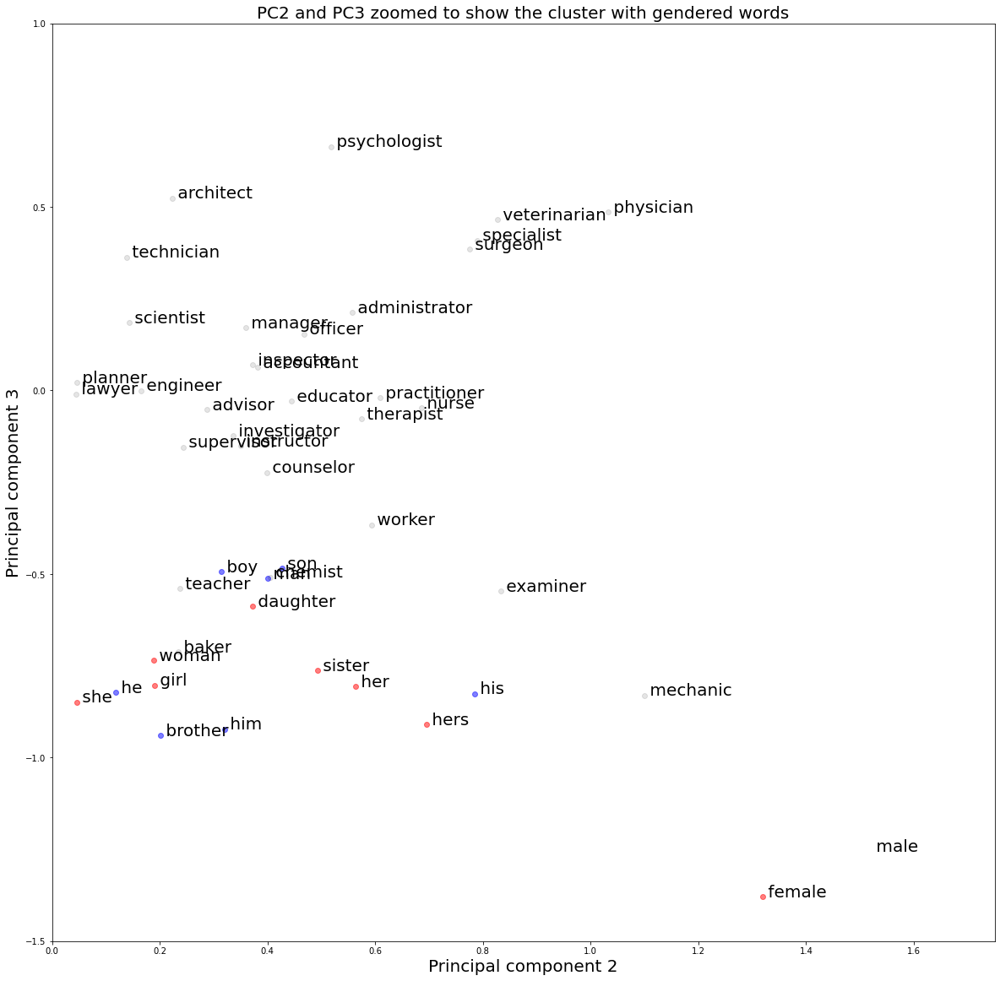

In [18]:
#plt.scatter(red_dat[:50, 0], red_dat[:50, 1], c='k') #first 50 are career words
plt.figure(figsize=(20, 20))

plt.title("PC2 and PC3 zoomed to show the cluster with gendered words", size = 20)


plt.scatter(red_dat[50:58, 1], red_dat[50:58, 2], c='r', alpha = 0.5) # female words
plt.scatter(red_dat[59:, 1], red_dat[59:, 2], c='b', alpha = 0.5) # male words
plt.scatter(red_dat[:50, 1], red_dat[:50, 2], c='k', alpha = 0.1) #first 50 are career words

for i, name in enumerate(ws):
    plt.annotate(name, (red_dat[i,1], red_dat[i,2]), size = 20)
    
plt.xlabel("Principal component 2", size = 20)
plt.ylabel("Principal component 3", size = 20)
plt.savefig('pc_fig1.png')
plt.xlim(0, 1.75)
plt.ylim(-1.5, 1)
plt.show()



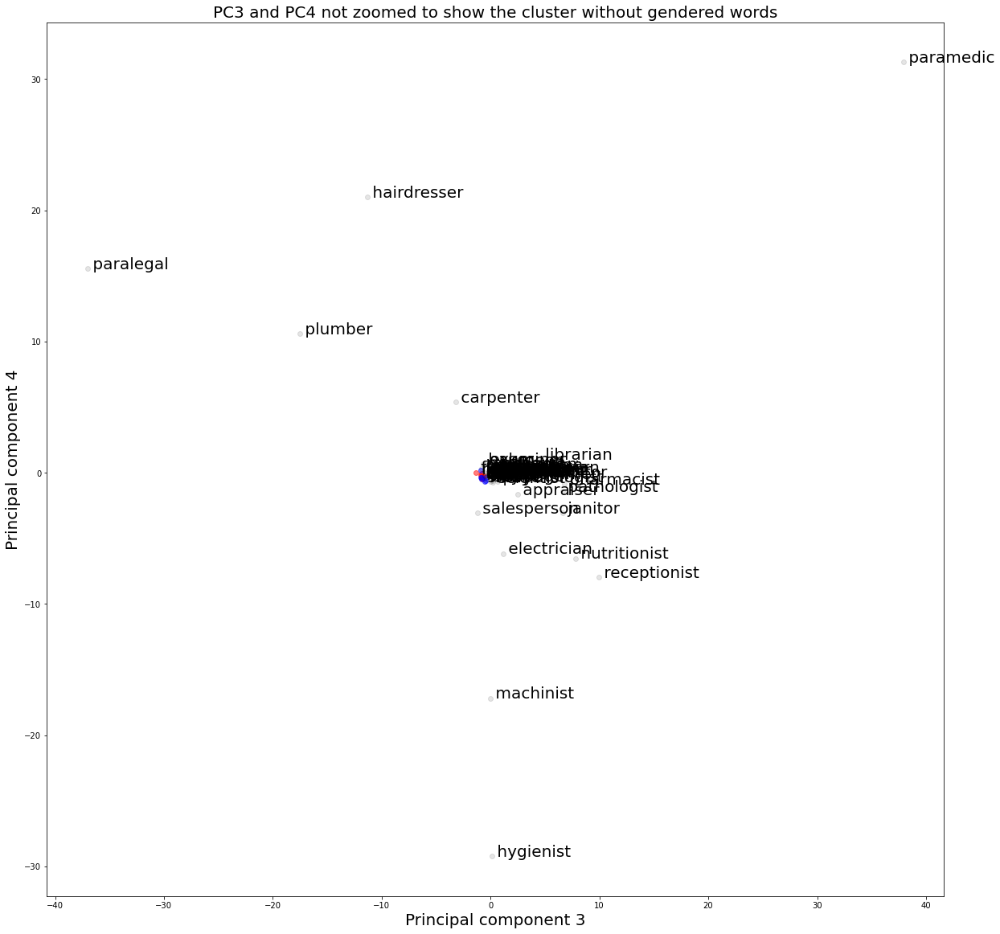

In [19]:
#plt.scatter(red_dat[:50, 0], red_dat[:50, 1], c='k') #first 50 are career words
plt.figure(figsize=(20, 20))

plt.title("PC3 and PC4 not zoomed to show the cluster without gendered words", size = 20)


plt.scatter(red_dat[50:58, 2], red_dat[50:58, 3], c='r', alpha = 0.5) # female words
plt.scatter(red_dat[59:, 2], red_dat[59:, 3], c='b', alpha = 0.5) # male words
plt.scatter(red_dat[:50, 2], red_dat[:50, 3], c='k', alpha = 0.1) #first 50 are career words

for i, name in enumerate(ws):
    plt.annotate(name, (red_dat[i,2], red_dat[i,3]), size = 20)
    
plt.xlabel("Principal component 3", size = 20)
plt.ylabel("Principal component 4", size = 20)
plt.savefig('pc_fig1.png')

plt.show()

# plt.xlim(-14, -5)
# plt.ylim(-1.5, 1.5)

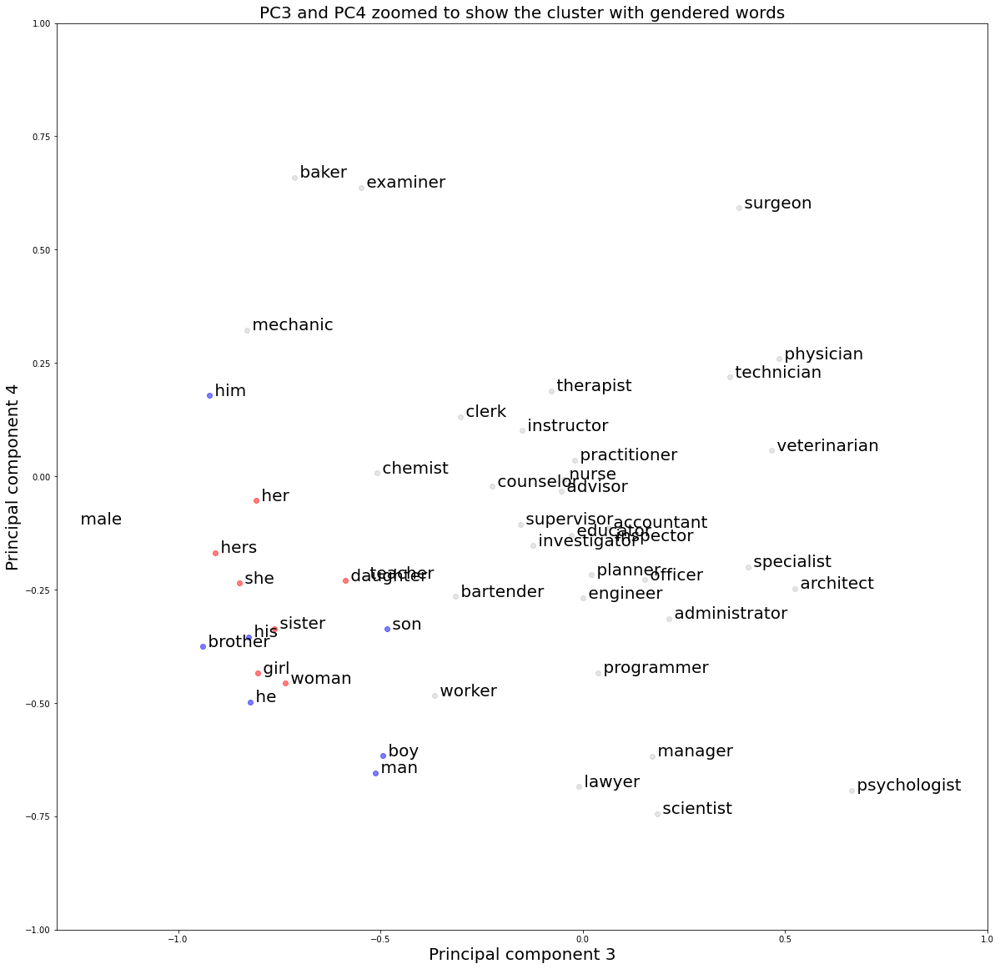

In [20]:
#plt.scatter(red_dat[:50, 0], red_dat[:50, 1], c='k') #first 50 are career words
plt.figure(figsize=(20, 20))

plt.title("PC3 and PC4 zoomed to show the cluster with gendered words", size = 20)


plt.scatter(red_dat[50:58, 2], red_dat[50:58, 3], c='r', alpha = 0.5) # female words
plt.scatter(red_dat[59:, 2], red_dat[59:, 3], c='b', alpha = 0.5) # male words
plt.scatter(red_dat[:50, 2], red_dat[:50, 3], c='k', alpha = 0.1) #first 50 are career words

for i, name in enumerate(ws):
    plt.annotate(name, (red_dat[i,2], red_dat[i,3]), size = 20)
    
plt.xlabel("Principal component 3", size = 20)
plt.ylabel("Principal component 4", size = 20)
plt.savefig('pc_fig1.png')
plt.xlim(-1.3, 1)
plt.ylim(-1, 1)
plt.show()



From the plots above, we notice that there is a cluster around gendered words, such as: mechanic, bartender, architect, baker, surgeon, accountant, supervisor.

Additionally, we see that there are some other words that are spacially far away from that cluster, meaning: paralegal, plumber, librarian, hairdresser, machinist, hygienist, pharmacist and salesperson.

It seems that our model considers the words near the gender-word cluster to be gendered-careers. And the words away from it to be non-gendered careers.

Our scope here is to 'discover' whether gender-bias or a gender-component is instrisic of a specific mode given a singular value decomposition of our matrix. 

We go about this by: creating the rank-1 matrix-reconstruction per each mode and plotting the covariances and correlation between woman-career and man-career across each mode.

If there is a mode that 'contains' bias, we expect the correlation or covariance to diverge systematically in a specific mode.  

## Singular value decomposition



In [21]:
u, s, vh = np.linalg.svd(scaled_dat, full_matrices=False)

In [22]:
u.shape # each row represents each word

(66, 66)

In [23]:
s.shape, s  # singular values 

((66,),
 array([1.5166562e+02, 6.7020981e+01, 5.9918186e+01, 5.5957623e+01,
        5.4365677e+01, 4.7179371e+01, 4.4650730e+01, 4.0084526e+01,
        3.5854889e+01, 3.5281452e+01, 2.8531898e+01, 2.8244211e+01,
        2.3241951e+01, 2.1388004e+01, 1.9079592e+01, 1.7891777e+01,
        1.5495920e+01, 1.5252658e+01, 1.3422255e+01, 1.0359640e+01,
        9.7154894e+00, 9.0867138e+00, 8.7375326e+00, 8.2000027e+00,
        7.9943213e+00, 7.4346251e+00, 7.2347746e+00, 6.8587890e+00,
        6.2028732e+00, 6.0851569e+00, 5.9021173e+00, 5.6004181e+00,
        5.5461202e+00, 5.3754878e+00, 5.1483464e+00, 4.9374685e+00,
        4.8573346e+00, 4.6973786e+00, 4.5872383e+00, 4.4211125e+00,
        4.3521490e+00, 4.1626630e+00, 4.0858936e+00, 3.9036441e+00,
        3.7793009e+00, 3.6867499e+00, 3.6011932e+00, 3.5257838e+00,
        3.3527265e+00, 3.2879279e+00, 3.2173471e+00, 3.1983557e+00,
        3.1043174e+00, 2.8944790e+00, 2.7493868e+00, 2.6387064e+00,
        2.4001439e+00, 2.2275383e+00, 2.

In [24]:
vh.shape  # 

(66, 768)

In [25]:
mode_id = 10

u_vec = u[:, mode_id]
v_vec = vh[mode_id, :]

mode_mat = np.outer(u_vec, v_vec)
mode_mat.shape

(66, 768)

In [26]:
word_scores = []
for word_idx, w in enumerate(ws):
    w_vec = mode_mat[word_idx, :]
    score = np.abs(w_vec).sum()
    word_scores.append((word_idx, w, score))
    
word_scores.sort(key=lambda vs: vs[2], reverse=True) 
#word_scores

In [27]:
index_woman = ws.index(' woman')
index_man = ws.index(' man')

index_she = ws.index(' she')
index_he = ws.index(' he')


def plotting_covs_svd(list_jobs, woman_word, man_word): # insert all these with a space at the beginning
    #for i, job in enumerate(jobs_selected_list): write a space before the word
    if len(list_jobs) == 24:
        fig, axs = plt.subplots( 6, 4, figsize = (40, 40))
    elif len(list_jobs) ==2:
        fig, axs = plt.subplots( 1, 2, figsize = (20, 10))
        
    else:
        fig, axs = plt.subplots(5, 3, figsize = (40, 40))
        
    fig.subplots_adjust(hspace = 0.5, wspace = 0.5)
    plt.suptitle(f"Plots showing the covariances between '{woman_word}'-job and '{man_word}'-job for each matrix out of the 66 matrices that decomposed through SVD the original matrix", size = 30)
    axs = axs.flatten()
    
    for i, job in enumerate(list_jobs):
        cov_list_w_job = []
        cov_list_m_job = []
        
        index_woman = ws.index(woman_word)
        index_man = ws.index(man_word)

        index_job = ws.index(f'{job}')

        for mode_id in range(0, 66):
            u_vec = u[:, mode_id]
            v_vec = vh[mode_id, :]

            mode_mat = np.outer(u_vec, v_vec)

            cov_list_w_job.append(np.cov(mode_mat[index_woman, :], mode_mat[index_job, :])[0,1])
            cov_list_m_job.append(np.cov(mode_mat[index_man, :], mode_mat[index_job, :])[0,1])
        
        axs[i].set_title(f"{job}", size = 20) 
        axs[i].plot(list(range(0,66)), cov_list_w_job, 'tomato', label = f"cov({woman_word}, {job})")
        axs[i].plot(list(range(0,66)), cov_list_m_job , 'cadetblue', label = f"cov({man_word}, {job})")
        axs[i].set_xlabel("j-th rank-1 matrix of 66 matrices", size = 20)
        axs[i].set_ylabel("covariances", size = 20)
        axs[i].legend(fontsize = 20)

            
def plotting_corrs_svd(list_jobs, woman_word, man_word): # insert all these with a space at the beginning
    #for i, job in enumerate(jobs_selected_list): write a space before the word

    if len(list_jobs) == 24:
        fig, axs = plt.subplots( 6, 4, figsize = (40, 40))
    elif len(list_jobs) ==2:
        fig, axs = plt.subplots( 1, 2, figsize = (20, 10))
    else:
        fig, axs = plt.subplots(5, 3 , figsize = (40, 40))
        
    fig.subplots_adjust(hspace = 0.5, wspace = 0.5)
    plt.suptitle(f"Plots showing the correlations between '{woman_word}'-job and '{man_word}'-job for each matrix out of the 66 matrices that decomposed through SVD the original matrix", size = 30)
    axs = axs.flatten()
    
    for i, job in enumerate(list_jobs):
        
        corr_list_w_job = []
        corr_list_m_job = []
        
        index_woman = ws.index(woman_word)
        index_man = ws.index(man_word)
        index_job = ws.index(f'{job}')

        for mode_id in range(0, 66):
            u_vec = u[:, mode_id]
            v_vec = vh[mode_id, :]

            mode_mat = np.outer(u_vec, v_vec)

            corr_list_w_job.append(pearsonr(mode_mat[index_woman, :], mode_mat[index_job, :])[0])
            corr_list_m_job.append(pearsonr(mode_mat[index_man, :], mode_mat[index_job, :])[0])
            

        axs[i].set_title(f"{job}", size = 20) 
        axs[i].plot(list(range(0,66)), corr_list_w_job,'tomato', alpha = 0.9,  label = f"corr({woman_word}, {job})")
        axs[i].plot(list(range(0,66)), corr_list_m_job , 'c--', alpha = 0.8, label = f"corr({man_word}, {job}" )
        axs[i].set_xlabel("j-th rank-1 matrix of 66 matrices", size = 20)
        axs[i].set_ylabel("correlations", size = 20)
        axs[i].legend(fontsize = 20)
        

In [28]:
list_gendered_jobs = [' mechanic', ' surgeon', ' baker', ' physician', ' veterinarian', ' examiner', ' surgeon', ' worker' , 
            ' practitioner', ' therapist', ' psychologist', ' accountant', ' manager', ' architect', ' engineer', 
            ' educator', ' counselor', ' clerk', ' programmer', ' bartender', ' teacher', ' lawyer', ' chemist', ' nurse']

list_ungendered_jobs = [' paramedic', ' paralegal', ' machinist', ' hygienist', ' electrician', ' receptionist', ' plumber', 
              ' nutritionist', ' pharmacist', ' salesperson', ' hairdresser', ' librarian', ' carpenter', ' janitor', ' appraiser']

list_tried_jobs = [' scientist', ' nurse']


In [29]:
len(list_gendered_jobs)

24

In [30]:
len(list_ungendered_jobs )

15

## "Gendered" jobs plots

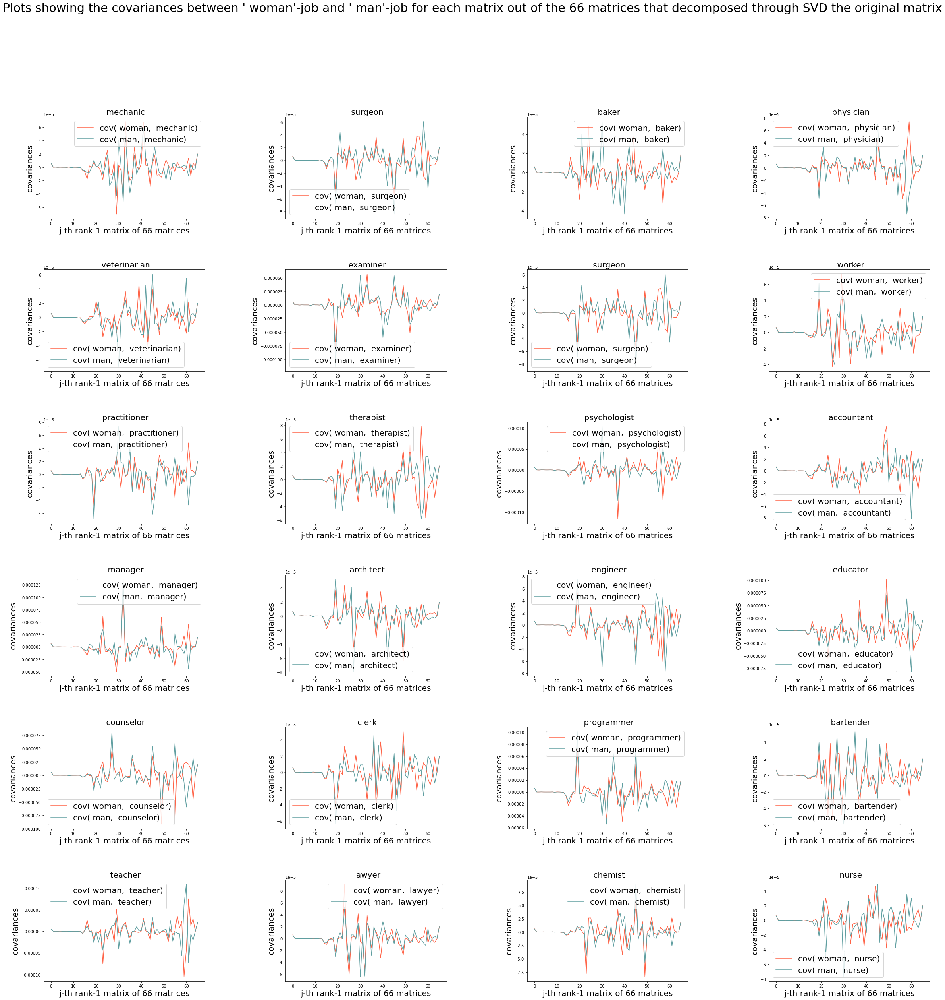

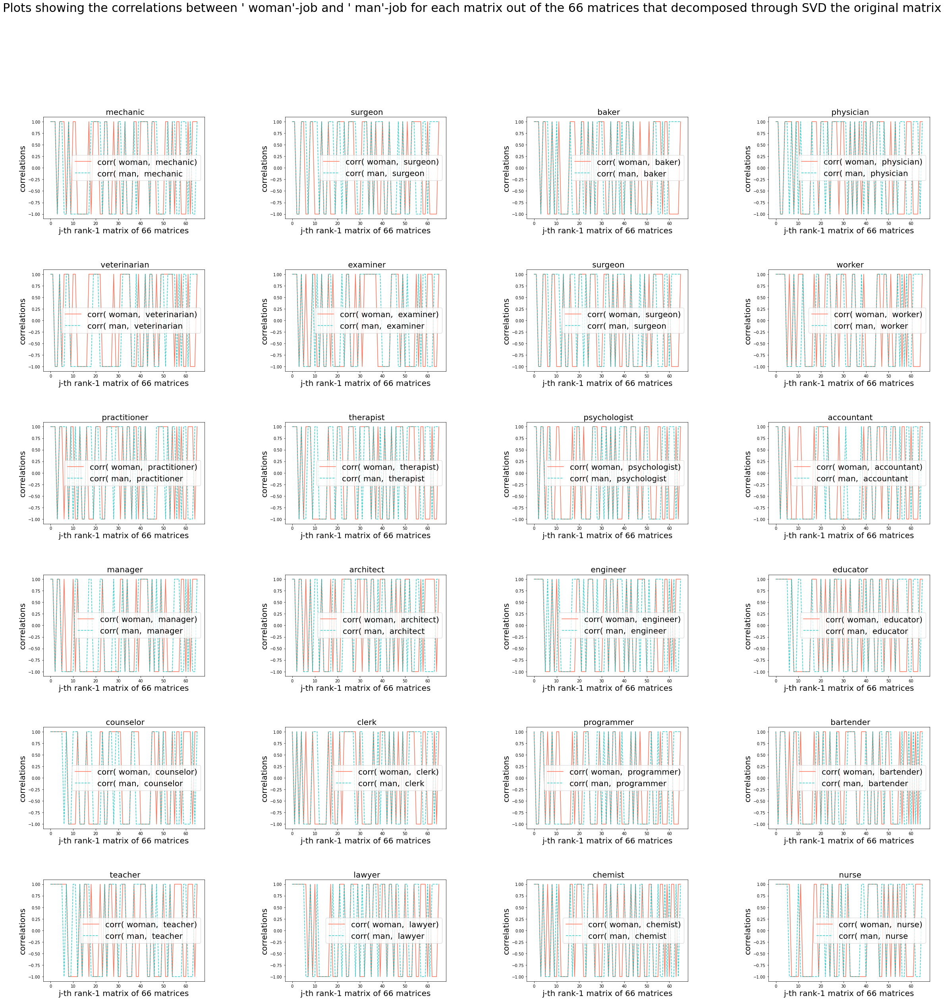

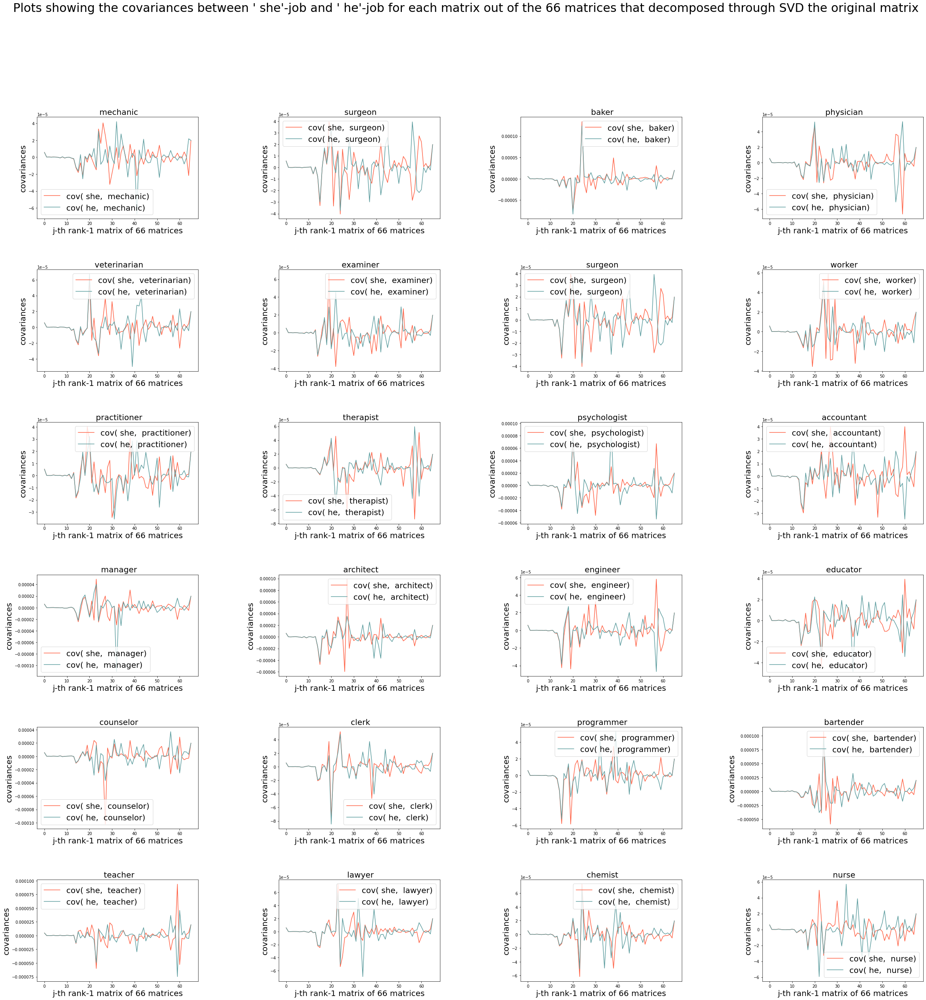

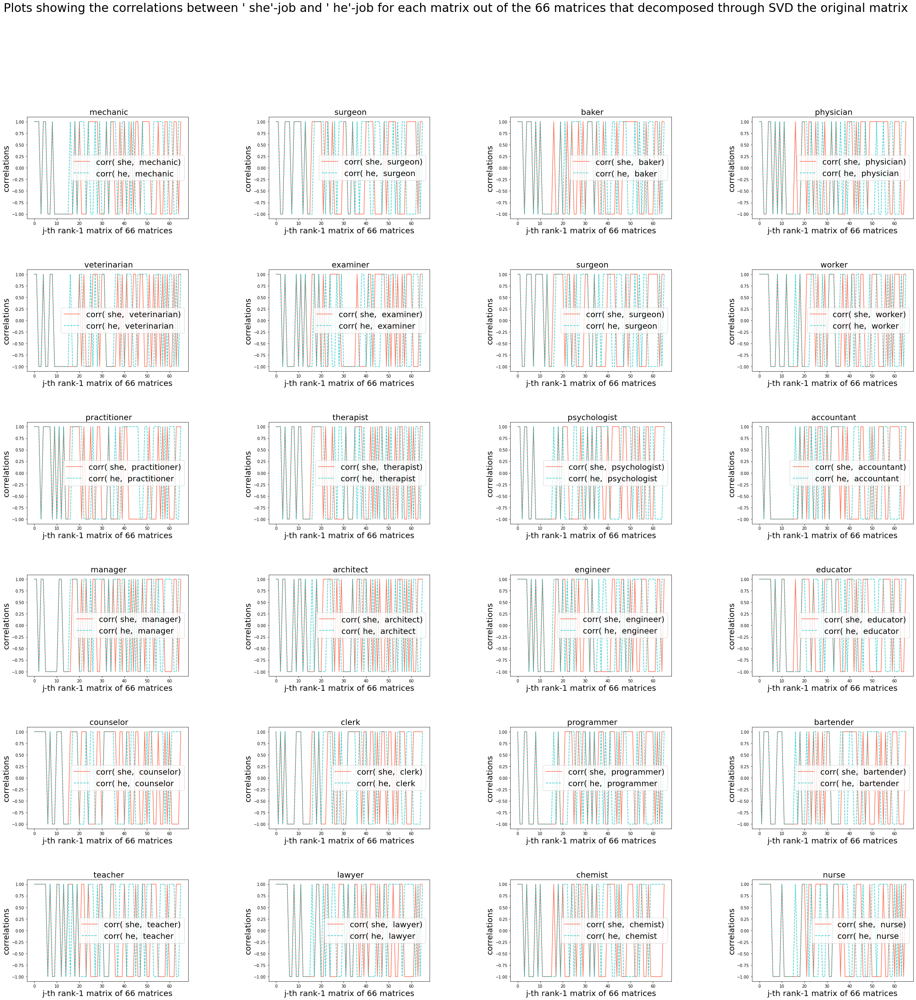

In [31]:
plotting_covs_svd(list_gendered_jobs, ' woman', ' man')
plotting_corrs_svd(list_gendered_jobs, ' woman', ' man')
plotting_covs_svd(list_gendered_jobs, ' she', ' he')
plotting_corrs_svd(list_gendered_jobs, ' she', ' he')

# "Ungedered" jobs plots

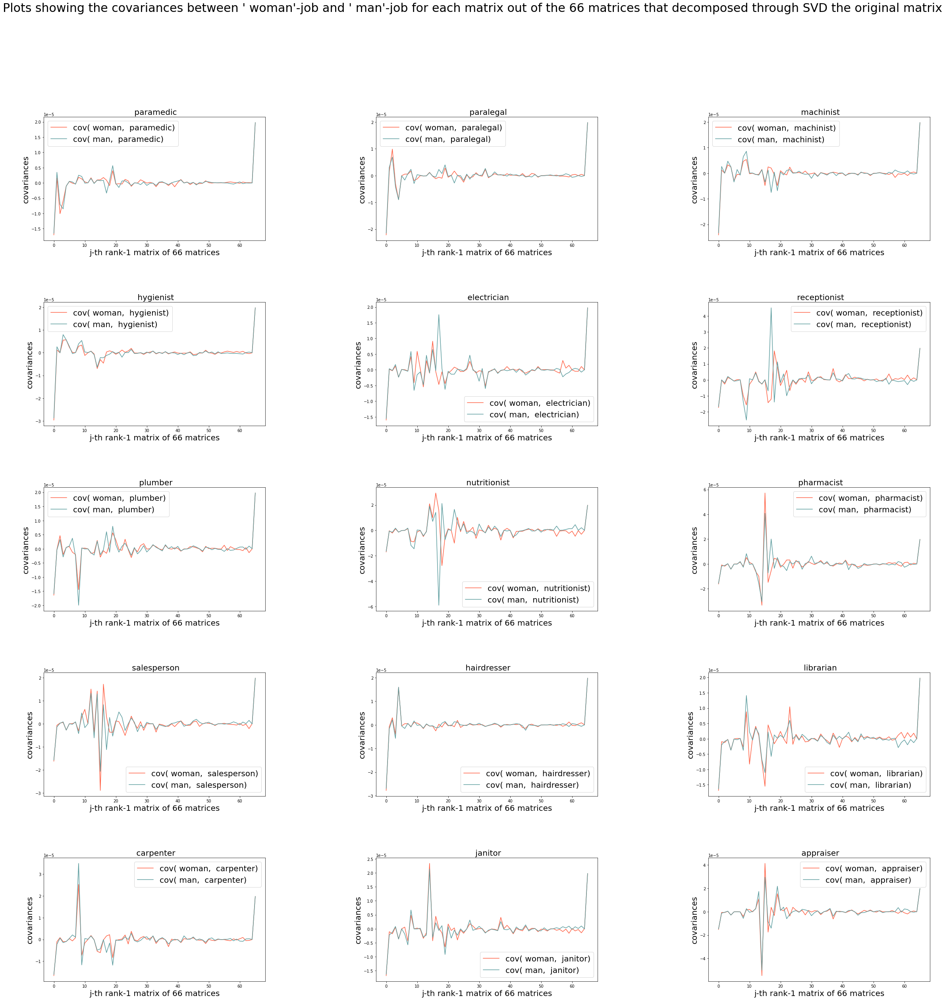

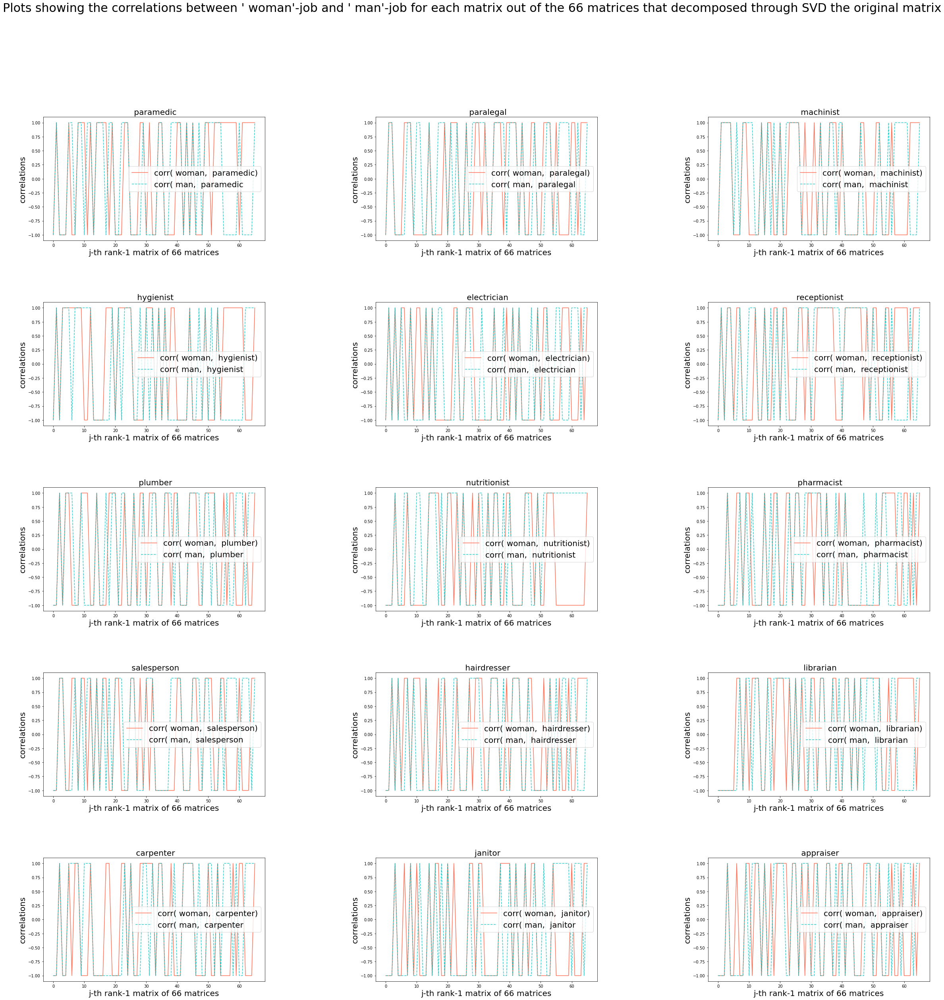

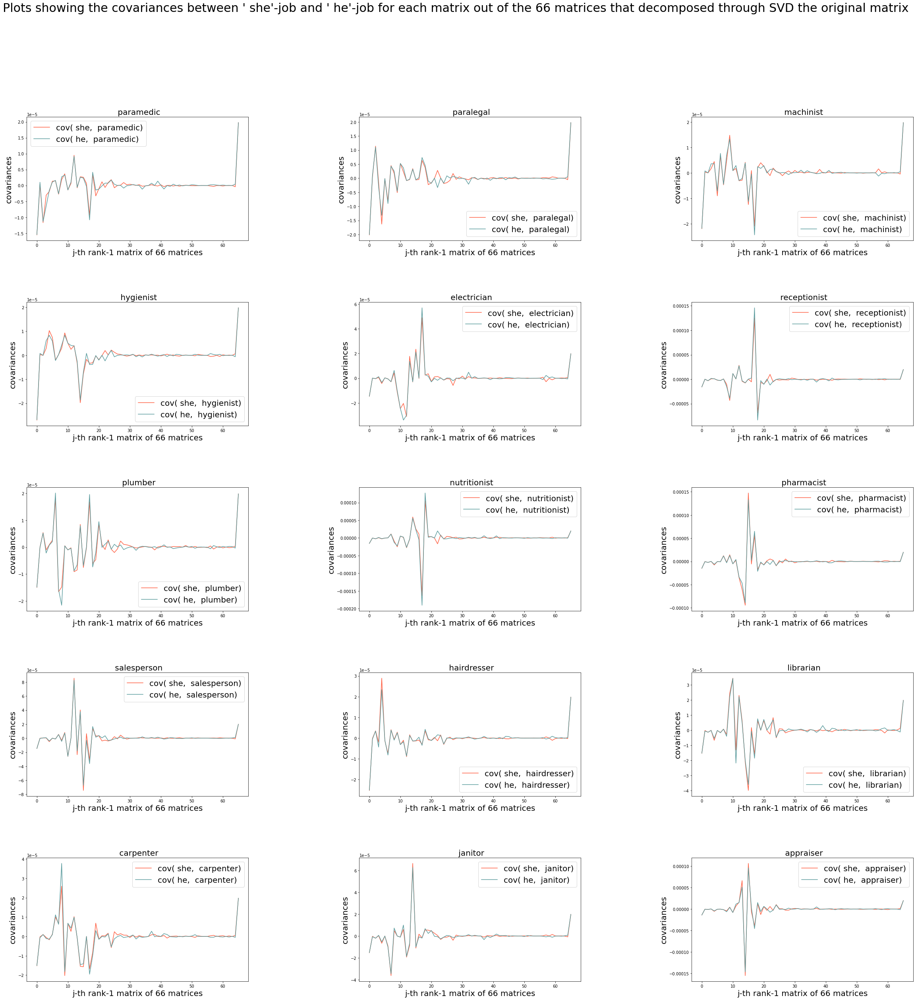

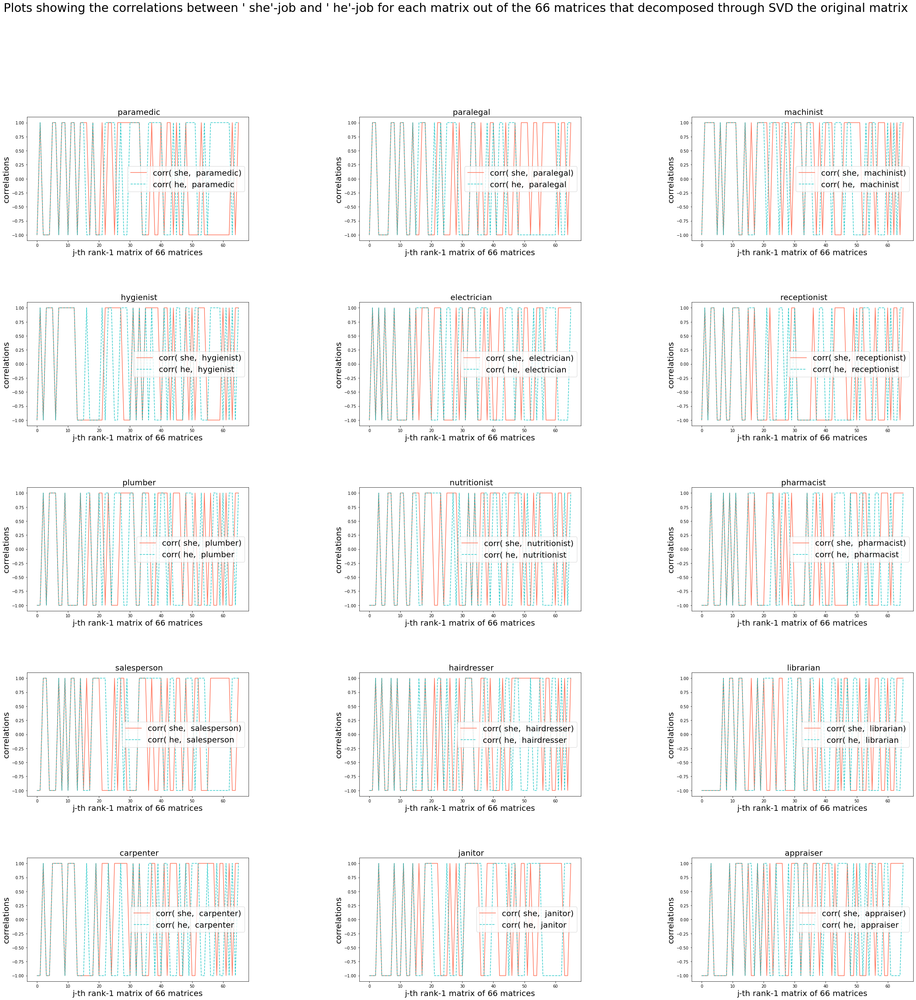

In [32]:
plotting_covs_svd(list_ungendered_jobs, ' woman', ' man')
plotting_corrs_svd(list_ungendered_jobs, ' woman', ' man')
plotting_covs_svd(list_ungendered_jobs, ' she', ' he')
plotting_corrs_svd(list_ungendered_jobs, ' she', ' he')

# Plots of a list of jobs tried out of interest for EDA

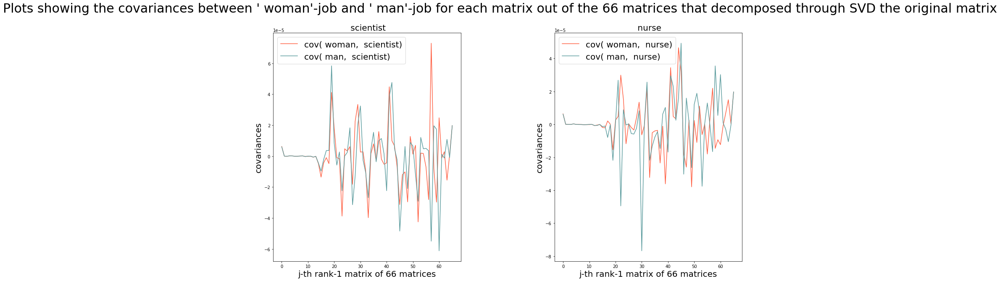

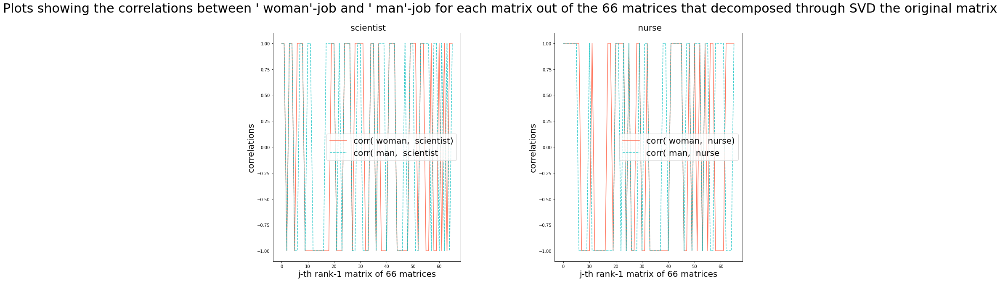

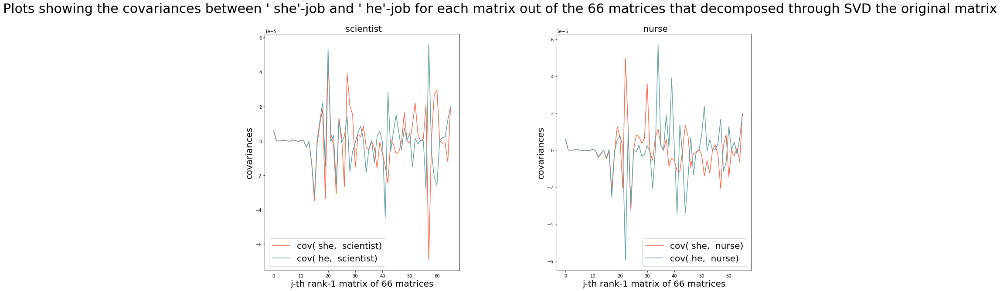

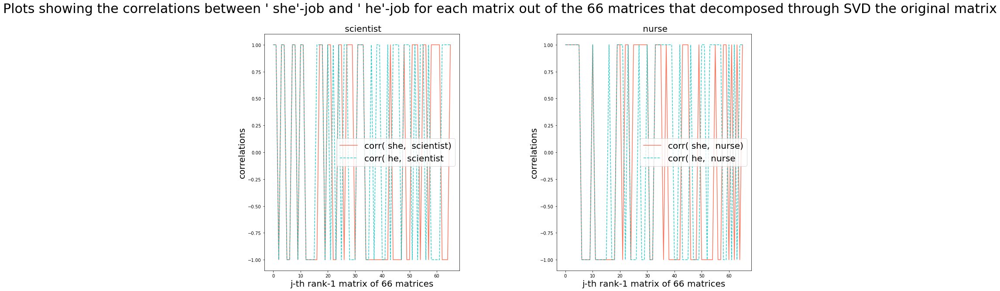

In [33]:
plotting_covs_svd(list_tried_jobs, ' woman', ' man')
plotting_corrs_svd(list_tried_jobs, ' woman', ' man')
plotting_covs_svd(list_tried_jobs, ' she', ' he')
plotting_corrs_svd(list_tried_jobs, ' she', ' he')

In [36]:
index_woman = ws.index(' woman')
index_man = ws.index(' man')

index_she = ws.index(' she')
index_he = ws.index(' he')


def plotting_covs_diff_svd(list_jobs, woman_word, man_word): # insert all these with a space at the beginning
    #for i, job in enumerate(jobs_selected_list): write a space before the word
    if len(list_jobs) == 24:
        fig, axs = plt.subplots( 6, 4, figsize = (40, 40))
    elif len(list_jobs) ==2:
        fig, axs = plt.subplots( 1, 2, figsize = (20, 10))
    else:
        fig, axs = plt.subplots(5, 3 , figsize = (40, 40))
        
    fig.subplots_adjust(hspace = 0.5, wspace = 0.5)
    plt.suptitle(f"Plots showing the covaiances differences between '{woman_word}'-job and '{man_word}'-job for each matrix out of the 66 matrices that decomposed through SVD the original matrix", size = 30)
    axs = axs.flatten()
    
    for i, job in enumerate(list_jobs):
        cov_list_w_job = []
        cov_list_m_job = []
        
        index_woman = ws.index(woman_word)
        index_man = ws.index(man_word)

        index_job = ws.index(f'{job}')

        for mode_id in range(0, 66):
            u_vec = u[:, mode_id]
            v_vec = vh[mode_id, :]

            mode_mat = np.outer(u_vec, v_vec)

            cov_list_w_job.append(np.cov(mode_mat[index_woman, :], mode_mat[index_job, :])[0,1])
            cov_list_m_job.append(np.cov(mode_mat[index_man, :], mode_mat[index_job, :])[0,1])
            
        vector_cov_w = np.asarray(cov_list_w_job)
        vector_cov_m = np.asarray(cov_list_m_job)
        difference = vector_cov_w - vector_cov_m
        axs[i].set_title(f"{job}", size = 20) 
        axs[i].plot(list(range(0,66)), difference, 'yellowgreen', label = f"cov({woman_word},{job}) - cov({man_word},{job})")
        axs[i].set_xlabel("j-th rank-1 matrix of 66 matrices", size = 20)
        axs[i].set_ylabel("covariances differences",  size = 20)
        axs[i].set_ylim(-0.00015, 0.00015)
        axs[i].legend(fontsize = 20)
        axs[i].tick_params(axis='both', which='major', labelsize=20, width=2.5, length=10)


            
def plotting_corrs_diff_svd(list_jobs, woman_word, man_word): # insert all these with a space at the beginning
    #for i, job in enumerate(jobs_selected_list): write a space before the word
    
    if len(list_jobs) == 24:
        fig, axs = plt.subplots( 6, 4, figsize = (40, 40))
    elif len(list_jobs) ==2:
        fig, axs = plt.subplots( 1, 2, figsize = (20, 10))
    else:
        fig, axs = plt.subplots(5, 3 , figsize = (40, 40))
    fig.subplots_adjust(hspace = 0.5, wspace = 0.5)
    plt.suptitle(f"Plots showing the correlations differences between '{woman_word}'-job and '{man_word}'-job for each matrix out of the 66 matrices that decomposed through SVD the original matrix", size = 30)
    axs = axs.flatten()
    
    for i, job in enumerate(list_jobs):
        
        corr_list_w_job = []
        corr_list_m_job = []
        
        index_woman = ws.index(woman_word)
        index_man = ws.index(man_word)
        index_job = ws.index(f'{job}')

        for mode_id in range(0, 66):
            u_vec = u[:, mode_id]
            v_vec = vh[mode_id, :]

            mode_mat = np.outer(u_vec, v_vec)

            corr_list_w_job.append(pearsonr(mode_mat[index_woman, :], mode_mat[index_job, :])[0])
            corr_list_m_job.append(pearsonr(mode_mat[index_man, :], mode_mat[index_job, :])[0])
            
        vector_corr_w = np.asarray(corr_list_w_job)
        vector_corr_m = np.asarray(corr_list_m_job)
        difference = vector_corr_w - vector_corr_m
        axs[i].set_title(f"{job}", size = 20)
        axs[i].plot(list(range(0,66)), difference, 'yellowgreen', label = f"corr({woman_word},{job}) - corr({man_word},{job})")
        axs[i].set_xlabel("j-th rank-1 matrix of 66 matrices", size = 20)
        axs[i].set_ylabel("correlation differences", size = 20)
        axs[i].legend(fontsize = 20)
        axs[i].tick_params(axis='both', which='major', labelsize=20, width=2.5, length=10)
        

NameError: name 'cov_list_w_bartender' is not defined

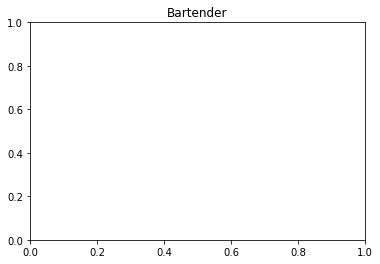

In [37]:
### GENDERED according to PCA, pc1 and pc2

plt.title("Bartender")    
plt.plot(list(range(0,66)), cov_list_w_bartender, label = "covariance between woman and bartender across 66 modes")
plt.plot(list(range(0,66)), cov_list_m_bartender , label = "covariance between man and bartender across 66 modes")
plt.legend()
plt.xlabel("j-th rank-1 matrix of 66 matrices")
plt.ylabel("covariances")
plt.show()

plt.title("Surgeon")    
plt.plot(list(range(0,66)), cov_list_w_surgeon, label = "covariance between woman and surgeon across 66 modes")
plt.plot(list(range(0,66)), cov_list_m_surgeon , label = "covariance between man and surgeon across 66 modes")
plt.legend()
plt.xlabel("j-th rank-1 matrix of 66 matrices")
plt.ylabel("covariances")
plt.show()

plt.title("Baker")    
plt.plot(list(range(0,66)), cov_list_w_baker, label = "covariance between woman and baker across 66 modes")
plt.plot(list(range(0,66)), cov_list_m_baker , label = "covariance between man and baker across 66 modes")
plt.legend()
plt.xlabel("j-th rank-1 matrix of 66 matrices")
plt.ylabel("covariances")
plt.show()

plt.title("Accountant")    
plt.plot(list(range(0,66)), cov_list_w_accountant, label = "covariance between woman and accountant across 66 modes")
plt.plot(list(range(0,66)), cov_list_m_accountant , label = "covariance between man and accountant across 66 modes")
plt.legend()
plt.xlabel("j-th rank-1 matrix of 66 matrices")
plt.ylabel("covariances")
plt.show()


plt.title("Supervisor")    
plt.plot(list(range(0,66)), cov_list_w_supervisor, label = "covariance between woman and supervisor across 66 modes")
plt.plot(list(range(0,66)), cov_list_m_supervisor , label = "covariance between man and supervisor across 66 modes")
plt.legend()
plt.xlabel("j-th rank-1 matrix of 66 matrices")
plt.ylabel("covariances")
plt.show()


plt.title("Mechanic")    
plt.plot(list(range(0,66)), cov_list_w_mechanic, label = "covariance between woman and mechanic across 66 modes")
plt.plot(list(range(0,66)), cov_list_m_mechanic , label = "covariance between man and mechanic across 66 modes")
plt.legend()
plt.xlabel("j-th rank-1 matrix of 66 matrices")
plt.ylabel("covariances")
plt.show()

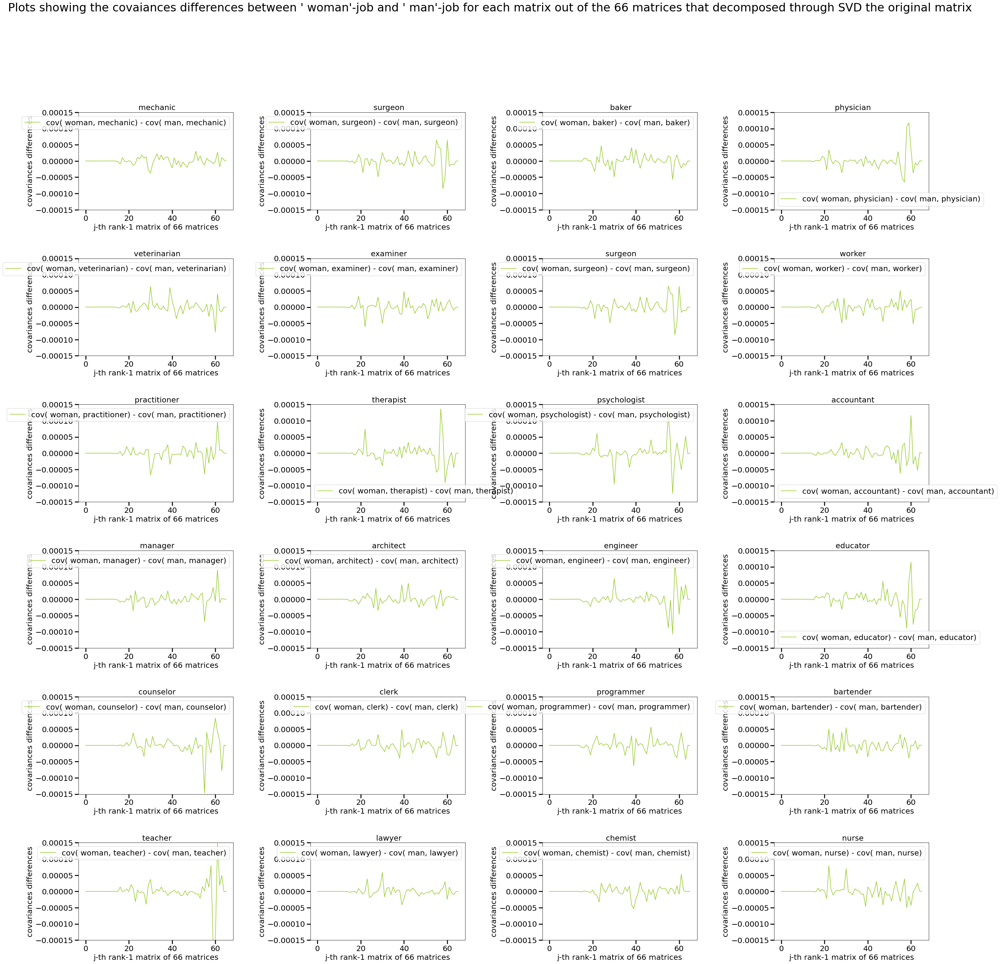

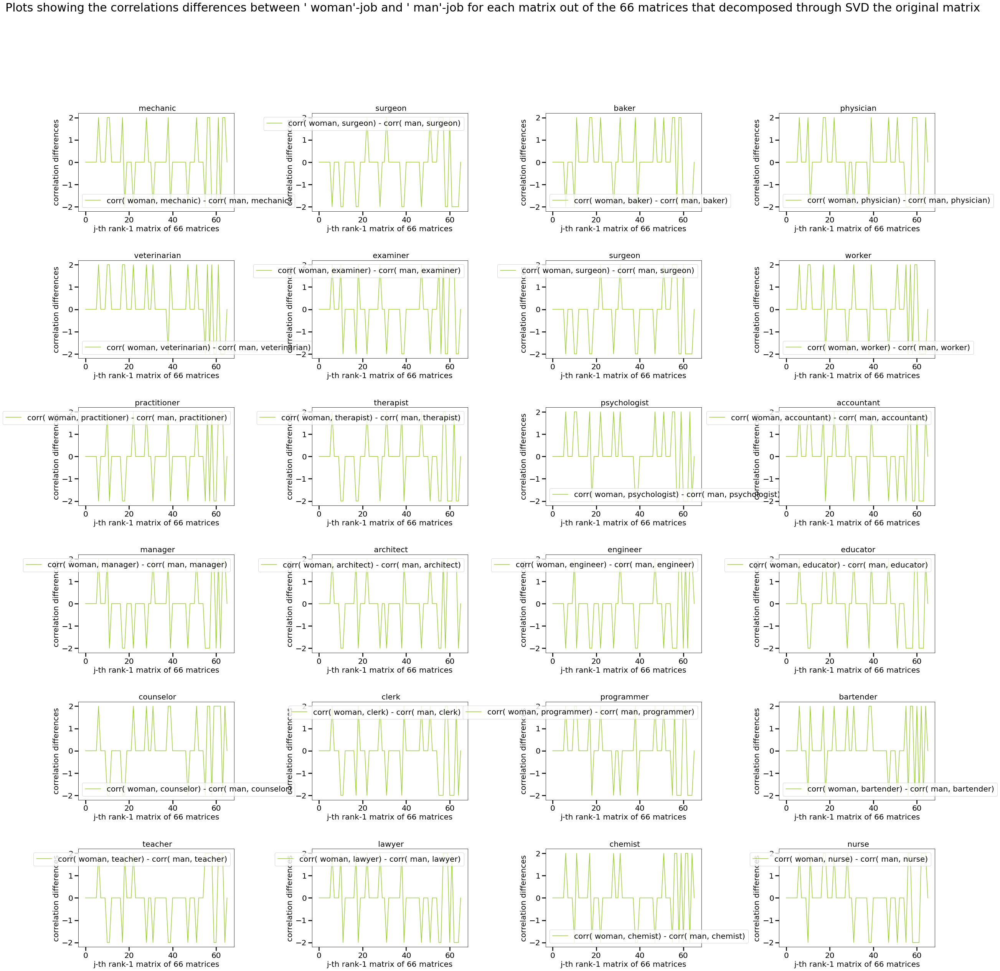

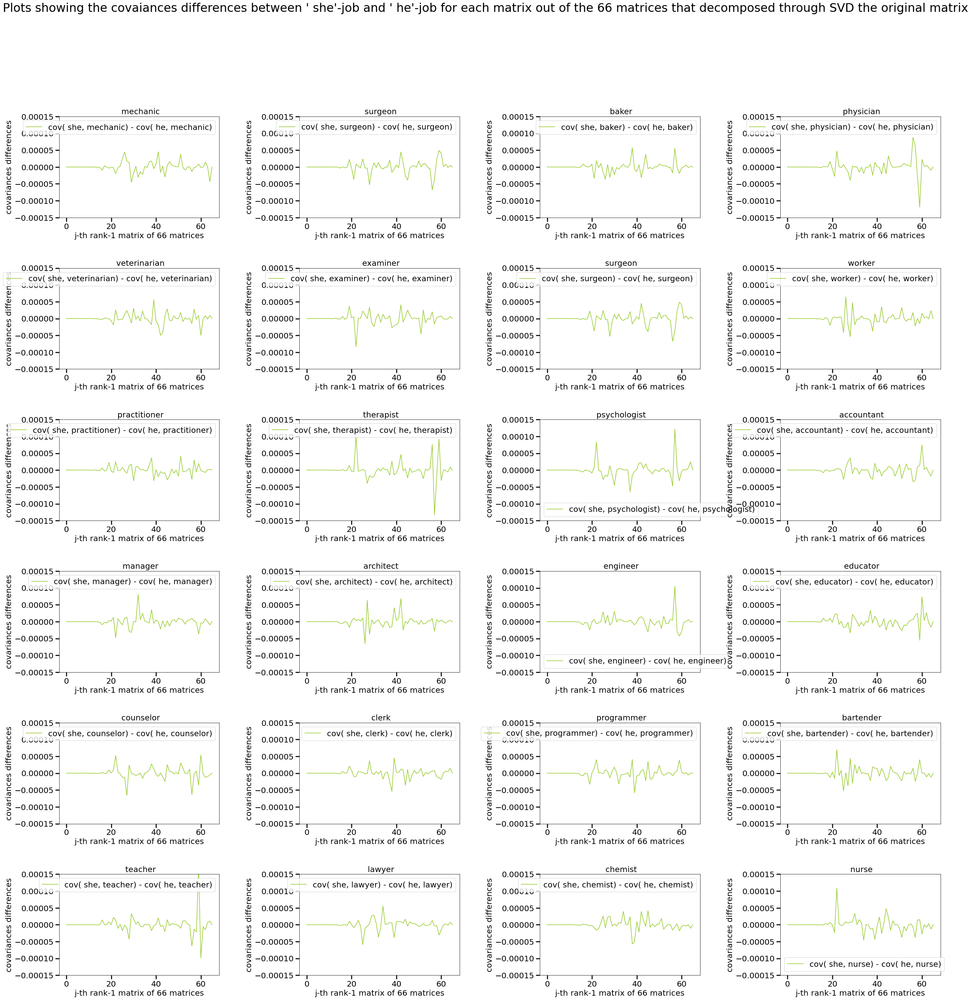

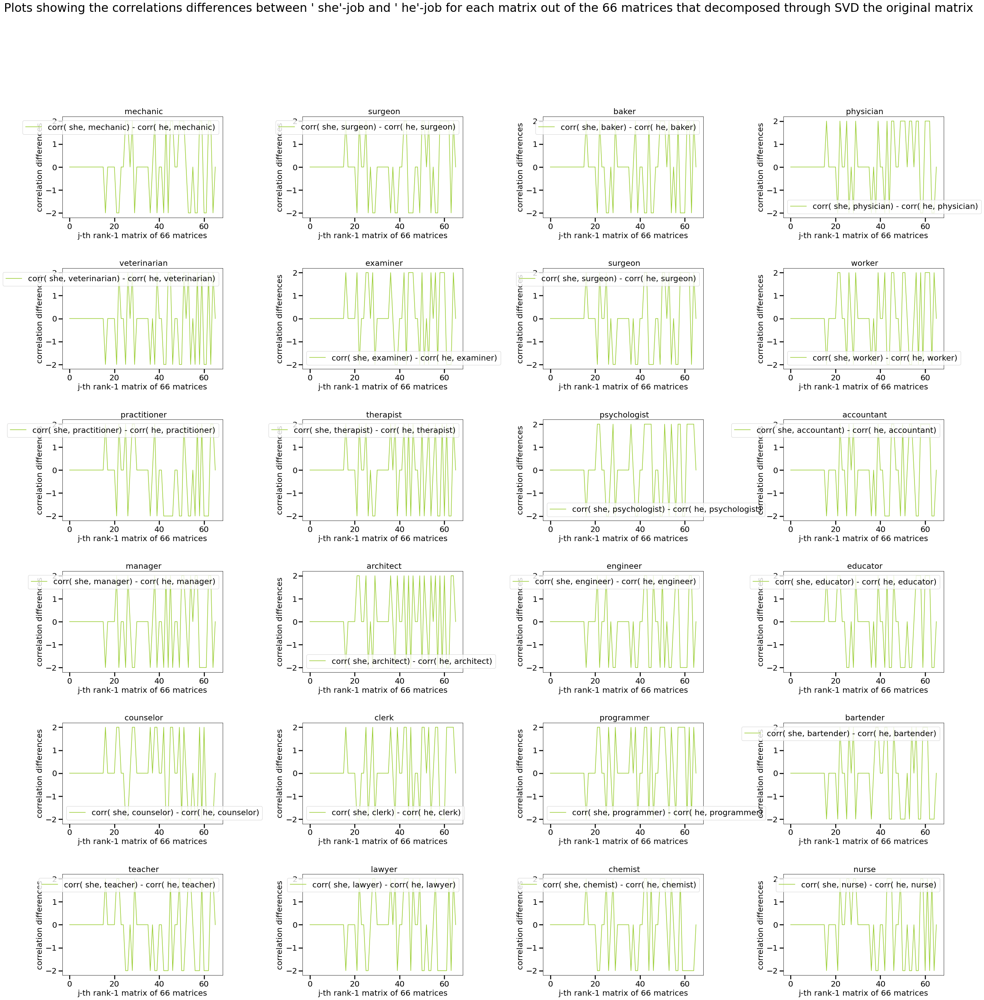

In [38]:
plotting_covs_diff_svd(list_gendered_jobs, ' woman', ' man')
plotting_corrs_diff_svd(list_gendered_jobs, ' woman', ' man')
plotting_covs_diff_svd(list_gendered_jobs, ' she', ' he')
plotting_corrs_diff_svd(list_gendered_jobs, ' she', ' he')

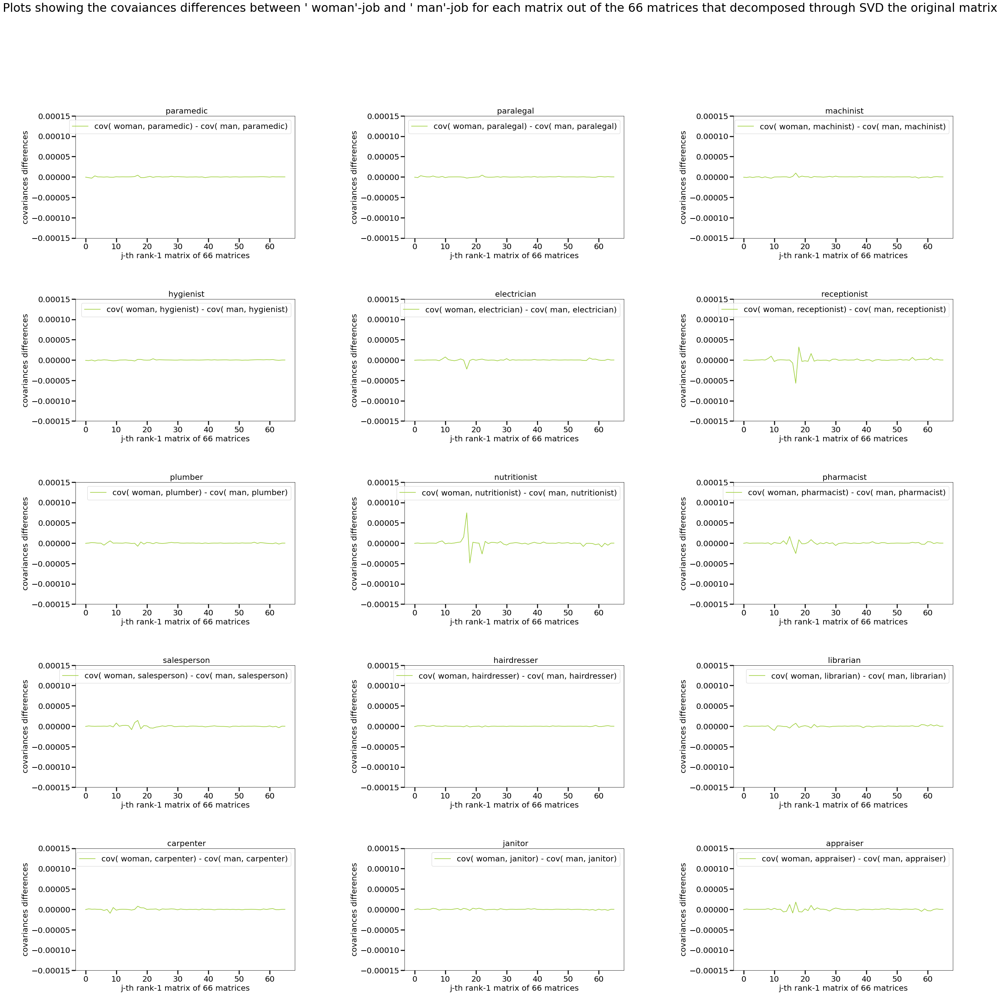

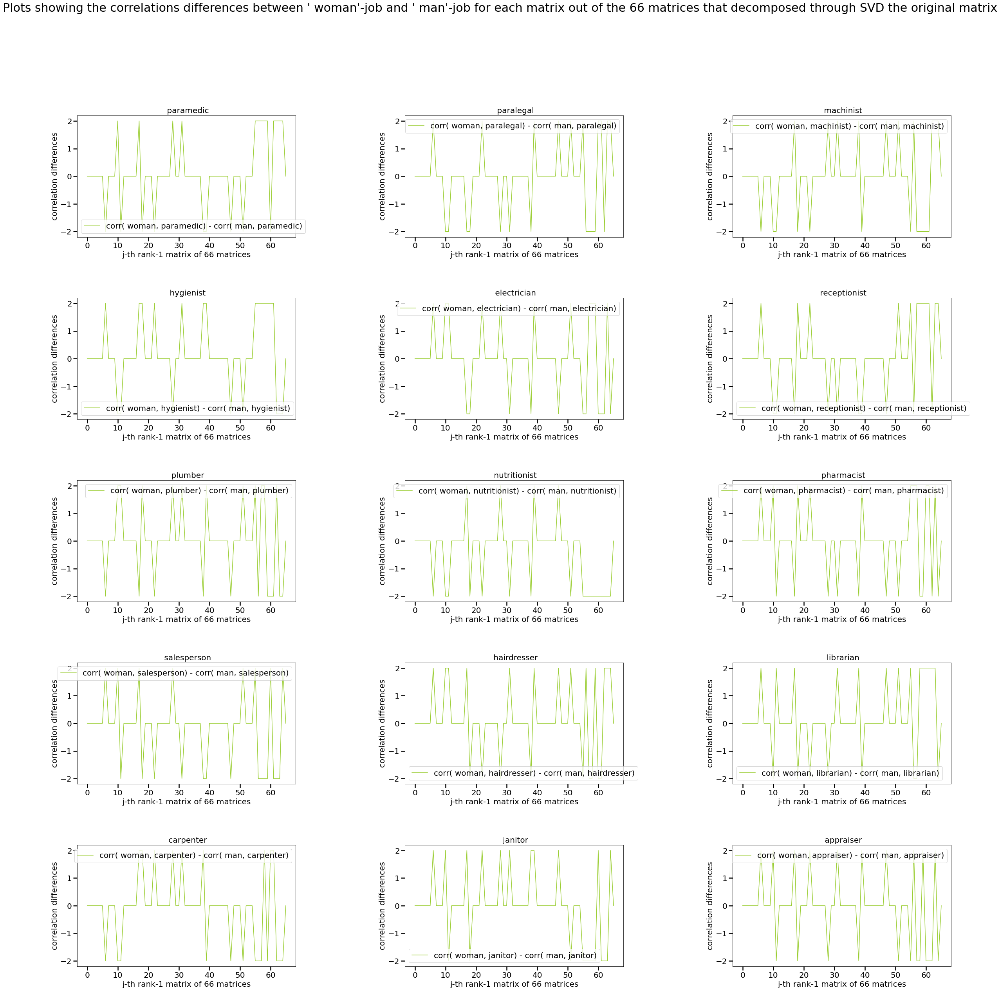

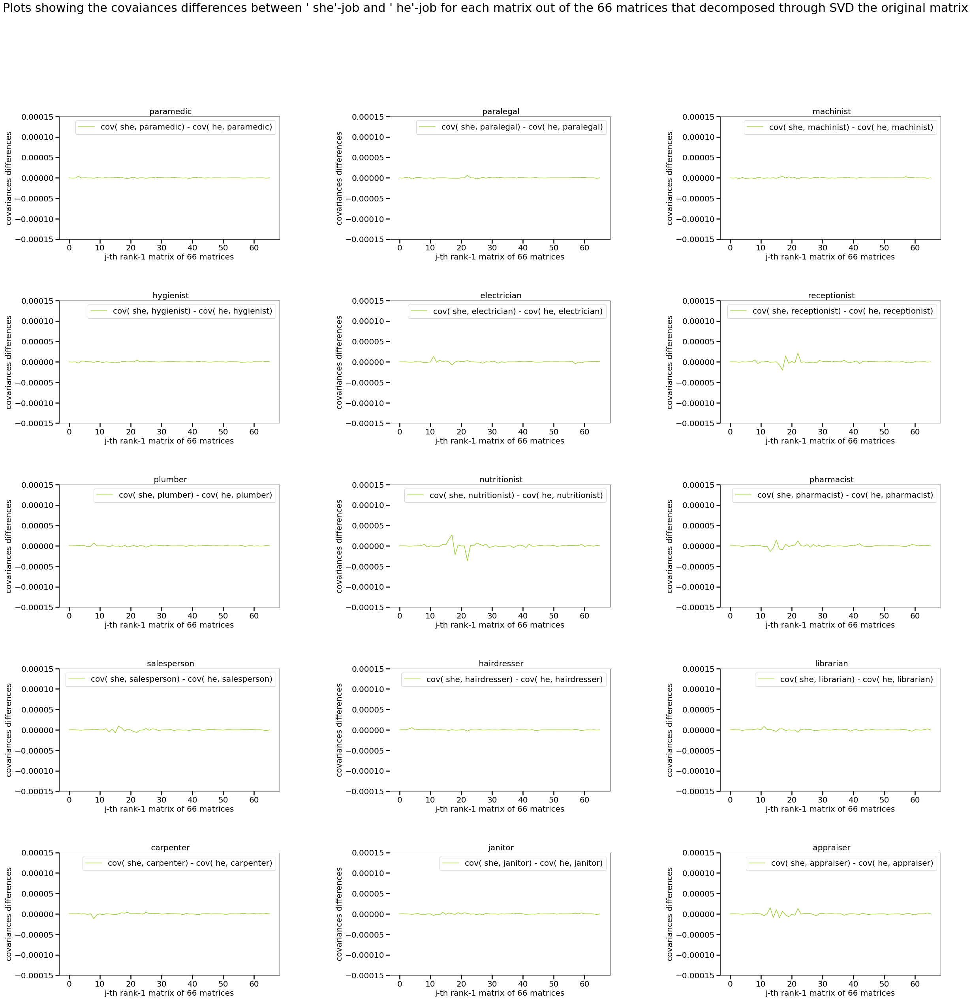

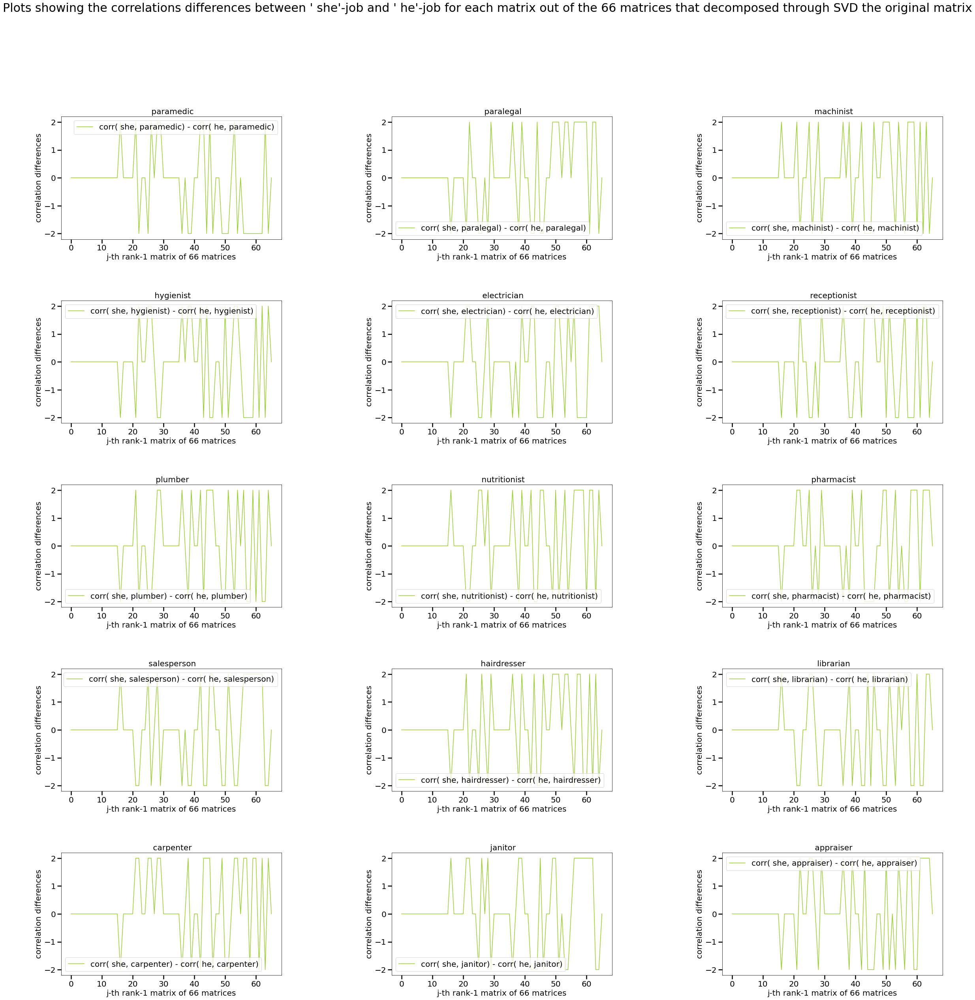

In [39]:
plotting_covs_diff_svd(list_ungendered_jobs, ' woman', ' man')
plotting_corrs_diff_svd(list_ungendered_jobs, ' woman', ' man')
plotting_covs_diff_svd(list_ungendered_jobs, ' she', ' he')
plotting_corrs_diff_svd(list_ungendered_jobs, ' she', ' he')

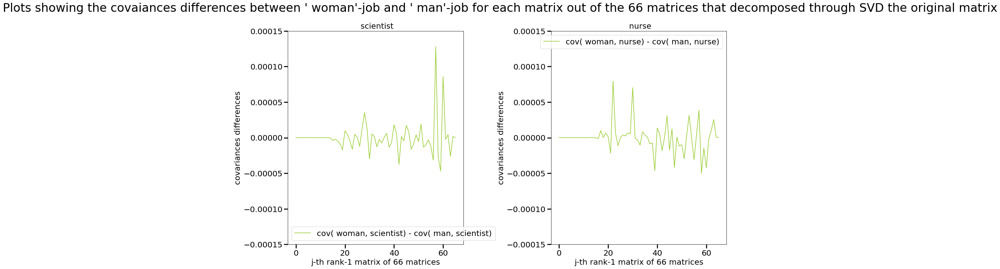

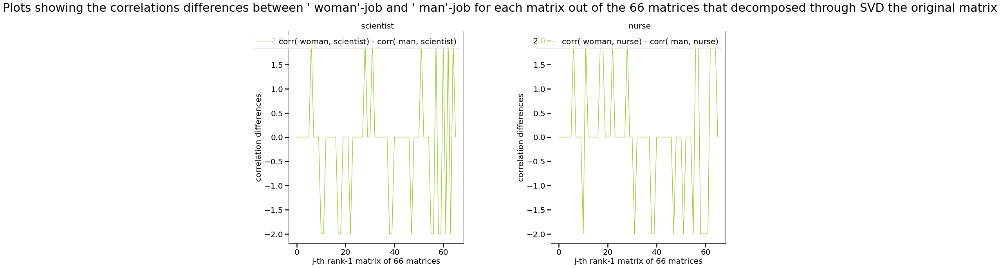

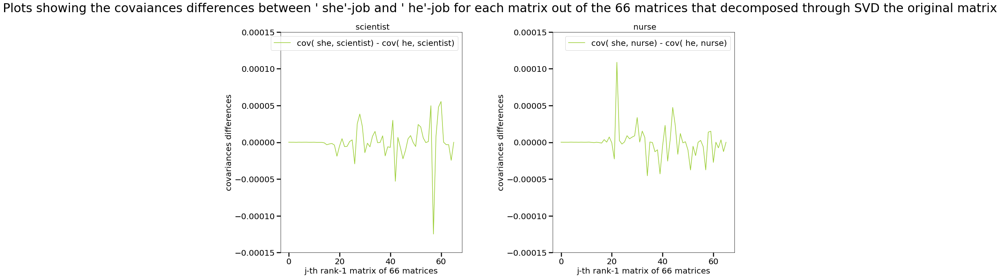

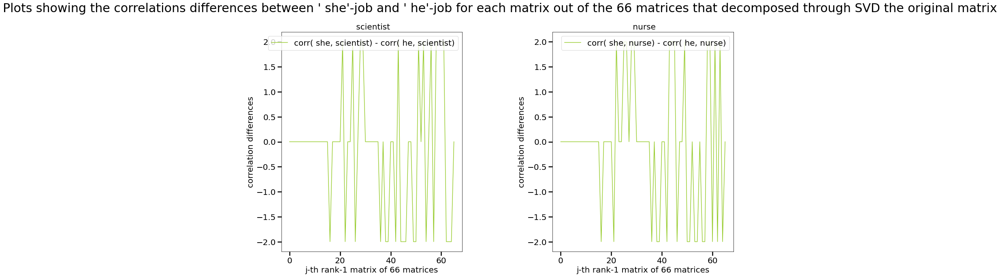

In [40]:
plotting_covs_diff_svd(list_tried_jobs, ' woman', ' man')
plotting_corrs_diff_svd(list_tried_jobs, ' woman', ' man')
plotting_covs_diff_svd(list_tried_jobs, ' she', ' he')
plotting_corrs_diff_svd(list_tried_jobs, ' she', ' he')

## Result - comments

We cannot notably see through the eye and these graphs a noticeable difference in a specific mode.

Given this, we cannot say whether gender bias is 'contained' is a specific mode given a singular value decomposition performed on a matrix of word vectors.

Nonetheless, we can affirm that this model 'contains bias' in a specif subset of words, i.e. the words clustered around the gendered-words in the PCA graphs plotted above. This can be reflected also by how the correlations and covariances of these words paired with man or woman vastly differ across our 66 modes. Whereas, the correlation and covariance pairs are perfectly overlapping across each mode of the 66 for the words away from the aforementioned 'gendered' cluster.

This leads to the conclusion that our model, although might not have a specific gender-bias subspace in a specific mode, has bias on a specific sub-set of words. Why does our model find bias in this specific cluster of words? This is an interesting question that we would have liked to explore further. However, this goes beyond the scope of this project, and in interest of time, we leave this for later research to explore.





# ==============================================================




# Cosine distance

Next, we try to see if these bias-carrying words have a greater distance for man compared to woman or vice versa. Meaning, if the distance of woman to surgeon is bigger than the distance of man to surgeon, we can infer that our model associates a woman less to the role of a surgeone compared to how it associates a man to a surgeon. Will the resulting distances mirror what we have found out from the PCA clusters seen above?

Each of our vectors spans across 768 latent spaces, meaning that it is impractical to plot these vectors and look at their distance, being that this would be above a 2-dimensions graph. 

Given this, we refer to another method for distance, i.e. the cosine distance. The cosine distance between two 1-dimensional arrays u and v is defined as:

$$ 1 - \frac{ u \cdot v} {||u ||_2 ||v||_2}$$



In [41]:
from scipy.spatial import distance


In [42]:
def distances_biases(job_name, woman_word, man_word): #insert the woman word and the men word with a space in front
    #input is a string

    v_woman = get_word_vec(woman_word)
    v_man = get_word_vec(man_word)
    v_man_array = v_man.detach().numpy()
    v_woman_array = v_woman.detach().numpy()

    v_job = get_word_vec(job_name).detach().numpy()

    woman_job = round(distance.cosine(v_job, v_woman_array),6)
    man_job = round(distance.cosine(v_job, v_man_array),6)
    print(f" Cosine distance of {woman_word} to {job_name} : {woman_job} ")
    print(f" Cosine distance of {man_word} to {job_name} : {man_job}")
    if woman_job> man_job: 
        times = np.round(woman_job/man_job, 1)
        print(f"The distance of '{woman_word}' to '{job_name}' is higher compared to '{man_job}' to {job_name}: our model associates a {man_word} to {job_name} {times} times more than how it associates a {woman_word} to this role.")
    
    if woman_job< man_job: 
        times = np.round(man_job/woman_job,1)
        print(f"The distance of '{woman_word}' to {job_name} is smaller compared to '{man_job}' to {job_name}: our model associates a {woman_word} to {job_name} {times } times more than how it associates a {man_word} to this role.")

    print("=========================================")

In [43]:
for i in list_gendered_jobs:
    distances_biases(i, ' woman', ' men')
print("======")
print("======")
print("======")
for i in list_gendered_jobs:
    distances_biases(i, ' she', ' he')

 Cosine distance of  woman to  mechanic : 7.1e-05 
 Cosine distance of  men to  mechanic : 0.000108
The distance of ' woman' to  mechanic is smaller compared to '0.000108' to  mechanic: our model associates a  woman to  mechanic 1.5 times more than how it associates a  men to this role.
 Cosine distance of  woman to  surgeon : 5.2e-05 
 Cosine distance of  men to  surgeon : 6.8e-05
The distance of ' woman' to  surgeon is smaller compared to '6.8e-05' to  surgeon: our model associates a  woman to  surgeon 1.3 times more than how it associates a  men to this role.
 Cosine distance of  woman to  baker : 0.000111 
 Cosine distance of  men to  baker : 0.000163
The distance of ' woman' to  baker is smaller compared to '0.000163' to  baker: our model associates a  woman to  baker 1.5 times more than how it associates a  men to this role.
 Cosine distance of  woman to  physician : 6.2e-05 
 Cosine distance of  men to  physician : 8.4e-05
The distance of ' woman' to  physician is smaller compar

In [44]:
for i in list_ungendered_jobs:
    distances_biases(i, ' woman', ' men')
    
print("======")
print("======")
print("======")
for i in list_ungendered_jobs:
    distances_biases(i, ' she', ' he')

 Cosine distance of  woman to  paramedic : 0.062208 
 Cosine distance of  men to  paramedic : 0.062956
The distance of ' woman' to  paramedic is smaller compared to '0.062956' to  paramedic: our model associates a  woman to  paramedic 1.0 times more than how it associates a  men to this role.
 Cosine distance of  woman to  paralegal : 0.020686 
 Cosine distance of  men to  paralegal : 0.020529
The distance of ' woman' to ' paralegal' is higher compared to '0.020529' to  paralegal: our model associates a  men to  paralegal 1.0 times more than how it associates a  woman to this role.
 Cosine distance of  woman to  machinist : 0.044053 
 Cosine distance of  men to  machinist : 0.044656
The distance of ' woman' to  machinist is smaller compared to '0.044656' to  machinist: our model associates a  woman to  machinist 1.0 times more than how it associates a  men to this role.
 Cosine distance of  woman to  hygienist : 0.08073 
 Cosine distance of  men to  hygienist : 0.081488
The distance of

In [45]:
for i in list_tried_jobs:
    distances_biases(i, ' woman', ' men')
print("======")
print("======")
print("======")
for i in list_tried_jobs:
    distances_biases(i, ' she', ' he')

 Cosine distance of  woman to  scientist : 0.000113 
 Cosine distance of  men to  scientist : 0.000162
The distance of ' woman' to  scientist is smaller compared to '0.000162' to  scientist: our model associates a  woman to  scientist 1.4 times more than how it associates a  men to this role.
 Cosine distance of  woman to  nurse : 4.4e-05 
 Cosine distance of  men to  nurse : 7.8e-05
The distance of ' woman' to  nurse is smaller compared to '7.8e-05' to  nurse: our model associates a  woman to  nurse 1.8 times more than how it associates a  men to this role.
 Cosine distance of  she to  scientist : 0.000431 
 Cosine distance of  he to  scientist : 0.000326
The distance of ' she' to ' scientist' is higher compared to '0.000326' to  scientist: our model associates a  he to  scientist 1.3 times more than how it associates a  she to this role.
 Cosine distance of  she to  nurse : 0.000287 
 Cosine distance of  he to  nurse : 0.000216
The distance of ' she' to ' nurse' is higher compared to